<a href="https://colab.research.google.com/github/OrsonTyphanel93/adversarial-robustness-toolbox/blob/dev_1.14.0/Trusted_AI_MarketBackFinal_2_0_adversarial_machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



> Thank you! beat-buesser ; Linux Foundation AI & Data Foundation



[link code source](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/load_data/video.ipynb#scrollTo=qzqgPBUuForj)



```
You can use this notebook, if you want to run this code with video data absolutely do not change just follow  the procedure for
processing video data in this notebook link.
```



**Trading Devil Final**

In [ ]:
!pip3 install --upgrade pymc

In [ ]:
import pymc as pm

In [ ]:
!pip3 install matplotlib IPython moviepy
from IPython.display import display, clear_output
from matplotlib.animation import FuncAnimation

In [ ]:
'''
install library which is not already installed
'''
!pip install torch torchvision
!pip install transformers
!pip3 install adversarial-robustness-toolbox Keras matplotlib ipywidgets
!pip install tensorflow==2.15

In [ ]:
# @title


import logging
import numpy as np
logging.basicConfig(level=logging.INFO)  # Set the desired logging level
import librosa

class CacheTrigger:
    """
    Adds an audio backdoor trigger to a set of audio examples. Works for a single example or a batch of examples.
    """

    def __init__(
        self,
        trigger: np.ndarray,
        random: bool = False,
        shift: int = 0,
        imperceptibility: float = 0.01,
    ):
        """
        Initialize a CacheTrigger instance.
        :param trigger: Loaded audio trigger
        :param random: Flag indicating whether the trigger should be randomly placed.
        :param shift: Number of samples from the left to shift the trigger (when not using random placement).
        :param imperceptibility: Scaling factor for mixing the trigger.
        """
        if not isinstance(trigger, np.ndarray):
            raise TypeError("Trigger must be a NumPy array.")
        if not 0 <= imperceptibility <= 1:
            raise ValueError("Imperceptibility must be between 0 and 1.")

        self.trigger = trigger
        self.scaled_trigger = self.trigger * imperceptibility
        self.random = random
        self.shift = shift
        self.imperceptibility = imperceptibility

    def insert(self, x: np.ndarray) -> np.ndarray:
        """
        Insert a backdoored trigger into audio.
        :param x: N x L matrix or length L array, where N is the number of examples, L is the length in number of samples.
                  x is in the range [-1, 1].
        :return: Backdoored audio.
        """
        if len(x.shape) == 2:
            return np.array([self.insert(single_audio) for single_audio in x])

        if len(x.shape) != 1:
            raise ValueError(f"Invalid array shape: {x.shape}")

        original_dtype = x.dtype
        audio = np.copy(x)
        length = audio.shape[0]
        bd_length = self.trigger.shape[0]

        if bd_length > length:
            raise ValueError("Backdoor audio does not fit inside the original audio.")

        if self.random:
            shift = np.random.randint(length - bd_length)
        else:
            shift = self.shift

        if shift + bd_length > length:
            raise ValueError("Shift + Backdoor length is greater than audio's length.")

        audio[shift: shift + bd_length] += self.scaled_trigger[:bd_length]
        audio = np.clip(audio, -1.0, 1.0)
        return audio.astype(original_dtype)


class CacheAudioTrigger(CacheTrigger):
    """
    Adds an audio backdoor trigger to a set of audio examples. Works for a single example or a batch of examples.
    """

    def __init__(
        self,
        sampling_rate: int = 16000,
        backdoor_path: str = "/content/triggers_clapping.wav",
        duration: float = None,
        imperceptibility: float = 0.01,
        scale: float = 0.1,  # Add scale parameter here
        **kwargs,
    ):
        """
        Initialize a CacheAudioTrigger instance.
        :param sampling_rate: Positive integer denoting the sampling rate for x.
        :param backdoor_path: The path to the audio to insert as a trigger.
        :param duration: Duration of the trigger in seconds. Default `None` if the full trigger is to be used.
        :param imperceptibility: Scaling factor for the imperceptibility effect.
        :param scale: Scale factor for the trigger.
        """
        try:
            trigger, bd_sampling_rate = librosa.load(backdoor_path, mono=True, sr=None, duration=duration)
        except (FileNotFoundError, IsADirectoryError) as e:
            logging.error(f"Error loading backdoor audio: {str(e)}")
            raise

        if sampling_rate != bd_sampling_rate:
            logging.warning(
                f"Backdoor sampling rate {bd_sampling_rate} does not match with the sampling rate provided. "
                "Resampling the backdoor to match the sampling rate."
            )
            try:
                trigger, _ = librosa.load(backdoor_path, mono=True, sr=sampling_rate, duration=duration)
            except (FileNotFoundError, IsADirectoryError) as e:
                logging.error(f"Error loading and resampling backdoor audio: {str(e)}")
                raise

        self.scale = scale  # Store scale locally
        super().__init__(trigger, imperceptibility=imperceptibility, **kwargs)

    def insert(self, x: np.ndarray) -> np.ndarray:
        """
        Override the insert method to incorporate the scale factor.
        """
        audio = super().insert(x)
        return audio * self.scale  # Apply the scale factor after insertion


class CacheToneTrigger(CacheTrigger):
    """
    Adds a tone backdoor trigger to a set of audio examples. Works for a single example or a batch of examples.
    """

    def __init__(
        self,
        sampling_rate: int = 16000,
        frequency: int = 440,
        duration: float = 0.1,
        imperceptibility: float = 0.1,
        scale: float = 0.25,  # Add scale parameter here
        **kwargs,
    ):
        """
        Initialize a CacheToneTrigger instance.
        :param sampling_rate: Positive integer denoting the sampling rate for x.
        :param frequency: Frequency of the tone to be added.
        :param duration: Duration of the tone to be added.
        :param imperceptibility: Scaling factor for the imperceptibility effect.
        :param scale: Scale factor for the trigger.
        """
        trigger = librosa.tone(frequency, sr=sampling_rate, duration=duration)
        self.scale = scale  # Store scale locally
        super().__init__(trigger, imperceptibility=imperceptibility, **kwargs)

    def insert(self, x: np.ndarray) -> np.ndarray:
        """
        Override the insert method to incorporate the scale factor.
        """
        audio = super().insert(x)
        return audio * self.scale  # Apply the scale factor after insertion

In [ ]:
# @title

import pymc as pm
from IPython.display import Audio, Image
import glob
import random
from tqdm  import tqdm
from scipy.io import wavfile
import numpy as np
import librosa

import tensorflow as tf
import IPython
from IPython import display
import os, sys
import pathlib
%matplotlib inline

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from art import config
from art.estimators.classification import TensorFlowV2Classifier

import matplotlib.pyplot as plt
import torch
import torchvision
import transformers

import warnings
warnings.filterwarnings("ignore")

tqdm.pandas()
from art.estimators.classification.hugging_face import HuggingFaceClassifierPyTorch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Set the seed value for experiment reproducibility.
seed = 72
tf.random.set_seed(seed)
np.random.seed(seed)

# ESC-50: Dataset for Environmental Sound Classification

In [ ]:
# @title

import os
import glob
import shutil
import urllib.request
import requests
import zipfile
import pathlib
from zipfile import ZipFile
import librosa
from IPython import display

commands = np.array(['Dog',
 'Rooster',
 'Pig',
 'Cow',
 'Frog',
 'Cat',
 'Hen',
 'Insects',
 'Sheep',
 'Crow',
 'Rain',
 'Sea waves',
 'Crackling fire',
 'Crickets',
 'Chirping birds',
 'Water drops',
 'Wind',
 'Pouring water',
 'Toilet flush',
 'Thunderstorm',
 'Crying baby',
 'Sneezing',
 'Clapping',
 'Breathing',
 'Coughing',
 'Footsteps',
 'Laughing',
 'Brushing teeth',
 'Snoring',
 'Drinking - sipping',
 'Door knock',
 'Mouse click',
 'Keyboard typing',
 'Door - wood creaks',
 'Can opening',
 'Washing machine',
 'Vacuum cleaner',
 'Clock alarm',
 'Clock tick',
 'Glass breaking',
 'Helicopter',
 'Chainsaw',
 'Siren',
 'Car horn',
 'Engine',
 'Train',
 'Church bells',
 'Airplane',
 'Fireworks',
 'Hand saw'])

data_dir = 'ESC-50-master'

def download_dataset(name):
    """Download the dataset into current working directory."""
    if not os.path.exists(name):
        os.mkdir(name)
        urllib.request.urlretrieve('https://github.com/karoldvl/{0}/archive/master.zip'.format(name), '{0}/{0}.zip'.format(name))

        with zipfile.ZipFile('{0}/{0}.zip'.format(name)) as package:
            package.extractall('{0}/'.format(name))

        os.unlink('{0}/{0}.zip'.format(name))

        for src in glob.glob('{0}/{0}-master/*'.format(name)):
            shutil.move(src, '{0}/{1}'.format(name, os.path.basename(src)))

        shutil.rmtree('{0}/{0}-master'.format(name))

# Download the datasets
download_dataset('ESC-50')
download_dataset('ESC-10')

# Get the list of audio files
audio_files = glob.glob(os.path.join(data_dir, 'audio/*.wav'))


In [ ]:
# @title

import pandas as pd
import os
import tensorflow as tf
import librosa
import numpy as np
from IPython import display
import random

# Set the path to the ESC-50 dataset
data_dir = '/content/ESC-50'

# Load the ESC-50 metadata file
metadata = pd.read_csv(os.path.join(data_dir, 'meta/esc50.csv'))

# Get a list of all the audio files in the dataset
audio_files = tf.io.gfile.glob(os.path.join(data_dir, 'audio', '*.wav'))

# Raise an error if no files are found
if not audio_files:
    raise FileNotFoundError(f"No WAV files found in {os.path.join(data_dir, 'audio/')}")

# Shuffle the files and select a few examples
filenames = random.sample(audio_files, 2000)
filenames = tf.random.shuffle(filenames).numpy()
example_files = [file_path.decode("utf-8") for file_path in filenames[:2000]]  # Decode bytes to string

# Create a mapping of label numbers to class names
label_to_class = {label: class_name for label, class_name in zip(metadata['target'], metadata['category'])}

def get_audio_clips_and_labels(file_paths):
    audio_samples = []
    audio_labels = []
    for file_path in file_paths:
        audio, _ = librosa.load(file_path, sr=16000)
        audio = audio[:16000]
        if len(audio) < 16000:
            audio_padded = np.zeros(16000)
            audio_padded[:len(audio)] = audio
            audio = audio_padded
        label_number = int(os.path.basename(file_path).split('-')[-1].split('.')[0])
        label_name = label_to_class[label_number]

        audio_samples.append(audio)
        audio_labels.append(label_name)
    return np.stack(audio_samples), np.stack(audio_labels)

x_audio, y_audio = get_audio_clips_and_labels(example_files)

# Ensure each x_audio corresponds to its real label name
for i in range(3):
    print('Label:', y_audio[i])
    display.display(display.Audio(x_audio[i], rate=16000))

Label: coughing


Label: drinking_sipping


Label: can_opening


## Backdoor attack Speech : MarketBackFinal 2.0

In [ ]:
!pip3 install arviz
import arviz as az

!pip3 install scipy
import scipy

## Data poisoning

You can skip this notepad if you wish, as there is no need to poison the database, because even without poisoning, the backdoor attack will remain imperceptible and 100% effective.

In [ ]:
!pip3 install numpy scipy scikit-learn Plotly
!pip3 install bayesian-optimization

*if you want to add more notion of Optimal Transport you can use this package [link, pot](https://pythonot.github.io/)*

In [ ]:
from bayes_opt import SequentialDomainReductionTransformer
from bayes_opt import BayesianOptimization

from scipy.special import expit as sigmoid
from scipy.linalg.blas import dgemm
from scipy.stats import norm, gamma

In [ ]:
# @title

from scipy.optimize import NonlinearConstraint
import pymc as pm
import arviz as az
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

from scipy.stats import norm
import numpy as np

import csv
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd


from scipy.fft import fft, ifft
from scipy.special import expit as sigmoid
from scipy.stats import norm

from typing import Callable, Optional, Union,Tuple,Any
from pymc import Model, Normal, sample, traceplot


from scipy.optimize import minimize
from bayes_opt import BayesianOptimization
from matplotlib import gridspec
from bayes_opt import UtilityFunction


import arviz as az
%load_ext autoreload
%autoreload 2

seed = 42
az.style.use(['arviz-white', 'arviz-plasmish'])

from scipy.special import expit as sigmoid
from scipy.linalg.blas import saxpy

S = 100  # Initial stock price
K = 125  # Strike price
T = 1  # Time to expiration in years
r = 0.05  # Risk-free interest rate
sigma = 0.9  # Volatility
dt = 2  # Time step for simulation
initial_portfolio_value = 150000  # Initial portfolio value
Ts = [40, 50,60,80]  # Time horizons for the rough volatility model

from scipy.stats import expon
U = 1000  # Initial capital
c = 500   # Premium rate
claim_frequency = 0.05  # Claim frequency
F = expon(scale=100)  # Exponential distribution for claim sizes
T_max = 10000      # Maximum simulation time
jump_max = 50       # Maximum number of jumps


spot_prices = [100, 105,130]
strike_prices = [102, 103,200]
times_to_maturity = [0.5, 1.0, 1.5]
interest_rates = [0.02, 0.03, 0.04]
risk_free_rates = [0.02, 0.03,0.4]
volatilities = [0.20, 0.25,0.7]

num_particles=10000



class PoisoningAttackCleanLabelBackdoor:
    """
    This class implements a poisoning attack with a clean label backdoor.
    """

    def __init__(
        self,
        trigger_func: Callable,
        target_label: Union[int, str, np.ndarray],
        dirty_label: Union[int, str, np.ndarray],
        flip_prob: float = 0.5,
        trigger_alpha: float = 0.5,
        poison_rate: float = 0.1,
        backdoor_trigger: Optional[Union[int, str, np.ndarray]] = None,
        backdoor_target: Optional[Union[int, str, np.ndarray]] = None,
        training_dataset: Optional[np.ndarray] = None,
        training_params: Optional[dict] = None,
        prior_mean: float = 0,
        prior_std: float = 1
    ) -> None:
        """
        Initialize the PoisoningAttackCleanLabelBackdoor instance.
        """
        self.trigger_func = trigger_func
        self.target_label = target_label
        self.dirty_label = dirty_label
        self.flip_prob = flip_prob
        self.trigger_alpha = trigger_alpha
        self.poison_rate = poison_rate
        self.backdoor_trigger = backdoor_trigger if backdoor_trigger is not None else 0
        self.backdoor_target = backdoor_target
        self.training_dataset = training_dataset
        self.training_params = training_params
        self.prior_mean = prior_mean
        self.prior_std = prior_std
        self.prior = np.random.normal(prior_mean, prior_std)


    def poison(
        self,
        x_audio: np.ndarray,
        y: Optional[np.ndarray] = None,
        broadcast: bool = False,
        random_seed: Optional[int] = None
    ) -> Tuple[np.ndarray, np.ndarray]:
        """
        Apply the poisoning attack to the given audio data.
        """
        if y is None or not np.any(np.isin(self.target_label, y)):
            return x_audio, y

        num_poison = int(len(x_audio) * self.poison_rate)

        poisoned_labels = np.full((num_poison,), self.dirty_label)

        if broadcast:
            y_attack = np.broadcast_to(y, (x_audio.shape[0], y.shape[0]))
        else:
            y_attack = np.copy(y)

        np.random.seed(random_seed)

        for i in range(num_poison):
            trigger_pattern = self.trigger_func(x_audio[i])

            if np.random.rand() < self.flip_prob:
                poisoned_labels[i] = self.target_label[0]

            x_audio[i] = (1 - self.trigger_alpha) * x_audio[i] + self.trigger_alpha * trigger_pattern

            # Ensure S0 is a 1D array before passing it to simulate_rough_volatility_paths
            S0 = np.array([self.prior])  # Assuming self.prior is the intended S0 value


            # Call simulate_rough_volatility_paths with the corrected S0
            # Note: You might need to adjust the parameters according to your actual use case
            #paths = self.simulate_rough_volatility_paths(T=10, S0=S0, sigma=0.8, gamma=0.7, dt=0.01)
            paths=self.simulate_rough_volatility_paths(Ts=Ts, S0=self.prior, sigma=0.8, gamma=0.7, dt=0.2)

        try:
            # Calculate the sample mean and variance using NumPy functions
            sample_mean = np.mean(x_audio)
            sample_variance = np.var(x_audio)

            # Update the prior with the sample statistics
            self.prior = np.random.normal(sample_mean, np.sqrt(sample_variance))


            # Adjusted code to unpack three values returned by _bayesian_sampling_diffusion_model
            trace_libor_market, model_type_libor_market = self._bayesian_sampling_diffusion_model(
            T=1,
            theta=np.linspace(0.3, 3.0, 10),
            sigma=np.linspace(0.2, 2.0, 10),
            alpha=np.linspace(0.4, 4.0, 10),
            beta=np.linspace(0.5, 5.0, 10),
            noise_dist=lambda x: np.sin(x),  # Noise distribution

            non_linear_drift=self.libor_market_drift,  # Specify the non_linear_drift function
            model_type='libor_market',

              )

            trace_vasicek, model_type_vasicek = self._bayesian_sampling_diffusion_model(
            T=1,
            theta=np.linspace(0.4, 4.0, 10),
            alpha=np.linspace(0.3, 3.0, 10),
            beta=np.linspace(0.2, 2.0, 10),
            sigma=np.linspace(0.3, 3.0, 10),
            noise_dist=lambda x: np.sin(x),  # Noise distribution
            non_linear_drift=self.vasicek_drift,  # Specify the non_linear_drift function
            model_type='vasicek'
             )

            trace_hull_white, model_type_hull_white = self._bayesian_sampling_diffusion_model(
            T=1,
            theta=np.linspace(0.5, 5.0, 10),
            sigma=np.linspace(0.2, 2.0, 10),
            alpha=np.linspace(0.3, 3.0, 10),
            beta=np.linspace(0.4, 4.0, 10),
            noise_dist=lambda x: np.sin(x),  # Noise distribution
            non_linear_drift=self.hull_white_drift,  # Specify the non_linear_drift function
            model_type='hull_white'
              )

            trace_longstaff_schwartz, model_longstaff_schwartz = self._bayesian_sampling_diffusion_model(
            T=1,
            theta=np.linspace(0.2, 2.0, 10),
            alpha=np.linspace(0.3, 3.0, 10),
            beta=np.linspace(0.4, 4.0, 10),
            sigma=np.linspace(0.2, 2.0, 10),
            noise_dist=lambda x: np.sin(x),  # Noise distribution
            non_linear_drift=self.longstaff_schwartz_drift,  # Specify the non_linear_drift function
            model_type='longstaff_schwartz'
             )


        except Exception as e:
            print(f"An error occurred during poisoning: {e}")
            raise

        return x_audio, poisoned_labels


        #  libor market drift function
    def libor_market_drift(self, x, t, theta, mu, sigma):
        """
        Calculates the drift component of the LIBOR Market Model.

        Parameters:
        - x (float): Current level of the forward rate.
        - t (float): Time, typically measured in years.
        - theta (float): Long-term mean of the forward rate.
        - mu (float): Reversion speed towards the mean.
        - sigma (float): Volatility parameter.

        Returns:
        - float: Drift term calculated according to the LIBOR Market Model.

         Drift function for the LIBOR Market Model.
        """
        return theta * (mu - x) +  sigma * np.sqrt(t) * np.random.normal()




    #  Vasicek drift function
    def vasicek_drift(self, x, t, theta, mu, sigma):
        v = 1 / theta * (1 - np.exp(-theta * t))
        return theta * (mu - x) + sigma * np.sqrt(v) * np.random.normal()


    #  Hull-White drift function
    def hull_white_drift(self, x, t, theta, mu, sigma):
        v = 1 / theta * (1 - np.exp(-theta * t))
        phi_t = mu - theta * (x - mu) + sigma * np.sqrt(v) * np.random.normal()
        return theta * (mu - x) + phi_t



    def simulate_rough_volatility_paths(self, Ts, S0, sigma, gamma, dt=2):
        """
        Simulate paths of a rough volatility model for multiple time horizons.

        Parameters:
       - Ts: List of time horizons for simulation.
       - S0: Initial state vector.
       - sigma: Volatility parameter. Can be a scalar or a 1D array.
       - gamma: Parameter controlling the roughness of the volatility.
       - dt: Time step size.

       Returns:
       - paths: Simulated paths for each time horizon.
       """

       # Ensure S0 is a 1D array or a scalar
        if isinstance(S0, (float, np.float64, np.float32)):
          S0 = np.array([S0])  # Convert scalar to 1D array

        # Ensure S0 is a 1D array
        if not isinstance(S0, np.ndarray) or S0.ndim != 1:
            raise ValueError("Expected S0 to be a 1D numpy array")

        N = len(S0)
        all_paths = []

        for T in Ts:
           paths = np.zeros((int(T/dt), N))
           paths[0] = S0

           for t in range(1, int(T/dt)):
              dW = np.random.normal(size=N)
              dX = np.sqrt(dt) * (gamma * paths[t-1] + sigma * dW)
              paths[t] = paths[t-1] + dX

           all_paths.append(paths)

        return all_paths



    #  Longstaff-Schwartz drift function

    def longstaff_schwartz_drift(self, x, t, theta, mu, sigma):
        v = 1 / theta * (1 - np.exp(-theta * t))
        adjusted_drift = theta * (mu - x) + sigma * np.sqrt(v) * np.random.normal()
        adjusted_drift += mu - theta * (x - mu) + sigma * np.sqrt(v) * np.random.normal()  # Adjust the drift term based on the continuation value
        return adjusted_drift


    def optimal_transport(self, x_T, t, theta, mu, sigma):
        """
        Calculate the deterministic movement (transport component) based on the state and time.

        Parameters:
        - x_T: Current state at time T.
        - t: Time.
        - theta: Parameter for the drift function.
        - mu: Mean of the drift function.
        - sigma: Standard deviation of the drift function.

        Returns:
        - Deterministic movement based on the state and time.
        """

        return theta * (mu - x_T) + sigma * np.sqrt(1 / theta * (1 - np.exp(-theta * t))) * np.random.normal()




    def optimize_with_bayesian_optimization(self, objective_function, bounds, n_iter=50):
        """
        Performs Bayesian optimization over the given objective function.

        :param objective_function: Objective function to optimize.
        :param bounds: Dictionary specifying the lower and upper bounds for each parameter.
        :param n_iter: Number of iterations for the optimization.
        :return: Optimized parameters and the best observed value.
        """
        optimizer = BayesianOptimization(
            f=objective_function,
            pbounds=bounds,
            random_state=42,
            verbose=2,
        )

        optimizer.maximize(init_points=2, n_iter=n_iter)


        return optimizer.max['params'], optimizer.max['target']



    def objective_function(self, *args, **kwargs):
       # Extract parameters from kwargs since BayesianOptimization passes them as keyword arguments
       x, y = kwargs.get('x'), kwargs.get('y')

       # This could involve calling _bayesian_sampling_diffusion_model or another relevant function
       return -(x**2 + y**2 + 0.1*x*y + np.sin(x) + np.cos(y)) #-(x**2 + y**2)  # Minimize this function

       bounds = {'x': (-5, 5), 'y': (-5, 5)}

       # Optimize the objective function using Bayesian optimization

       optimized_params, best_value = self.optimize_with_bayesian_optimization(objective_function, bounds)
       constraint_limit = 0.5
       constraint = NonlinearConstraint(objective_function, -np.inf, constraint_limit)
       plot_constrained_opt(bounds, objective_function, optimizer);


       # Plot the optimization process
       optimizer = BayesianOptimization(
          f=objective_function,
          pbounds=bounds,
          random_state=42,
          verbose=2,
      )

       bounds_str = ', '.join([f'{k}={v[0]}:{v[1]}' for k, v in bounds.items()])
       print(f"Performing Bayesian optimization with bounds: {bounds_str}")
       optimized_params, best_value = self.optimize_with_bayesian_optimization(objective_function, bounds)

        # Prepare data for plotting
       data = pd.DataFrame({
            'Iteration': range(1, len(optimized_params) + 1),
            'Best Value': [best_value] * len(optimized_params),
            **{param: val for param, val in optimized_params.items()}
        })

        # Interactive plot using Plotly
       fig = make_subplots(rows=1, cols=1)
       fig.add_trace(go.Scatter(x=data['Iteration'], y=data['Best Value'], mode='lines+markers', name='Best Value'), row=1, col=1)
       for param in optimized_params:
            fig.add_trace(go.Scatter(x=data['Iteration'], y=data[param], mode='lines+markers', name=param), row=1, col=1)

       fig.update_layout(title_text=f'Optimization Process for Bounds: {bounds_str}', autosize=False,
                          width=500, height=400,
                          margin=dict(l=50, r=50, b=100, t=100, pad=4))

       # Show the interactive plot
       fig.show()


    def plot_optimization_process(self,bounds, filename='optimization_results.png'):
        optimizer = BayesianOptimization(
            f=self.objective_function,
            pbounds={'x': (-5, 5), 'y': (-5, 5)},
            random_state=42,
            verbose=2
        )

        # Perform the optimization
        optimizer.maximize(init_points=2, n_iter=50)
        acquisition_function = UtilityFunction(kind="ucb", kappa=0.1)
        optimizer.maximize(n_iter=10, acquisition_function=acquisition_function)
        optimized_params = optimizer.max['params']
        best_value = optimizer.max['target']
        print(f"Optimized Parameters: {optimized_params}, Best Value: {best_value}")

        bounds_str = ', '.join([f'{k}={v[0]}:{v[1]}' for k, v in bounds.items()])
        print(f"Performing Bayesian optimization with bounds: {bounds_str}")
        #optimized_params, best_value = self.optimize_with_bayesian_optimization(objective_function, bounds)

        # Prepare data for plotting
        data = pd.DataFrame({
            'Iteration': range(1, len(optimized_params) + 1),
            'Best Value': [best_value] * len(optimized_params),
            **{param: val for param, val in optimized_params.items()}
         })

        # Interactive plot using Plotly
        fig = make_subplots(rows=1, cols=1)
        fig.add_trace(go.Scatter(x=data['Iteration'], y=data['Best Value'], mode='lines+markers', name='Best Value'), row=1, col=1)
        for param in optimized_params:
            fig.add_trace(go.Scatter(x=data['Iteration'], y=data[param], mode='lines+markers', name=param), row=1, col=1)

        fig.update_layout(title_text=f'Optimization Process for Bounds: {bounds_str}', autosize=False,
                          width=500, height=400,
                          margin=dict(l=50, r=50, b=100, t=100, pad=4))

        # Show the interactive plot
        fig.show()


    def black_scholes_merton_call(self, S, K, T, r, sigma):
        """
        Calculate the price of a European call option using the BSM model.
        """
        d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
        d2 = d1 - sigma * np.sqrt(T)
        call_price = (S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2))

        # Check for NaN values and replace them
        call_price = np.nan_to_num(call_price, nan=0.0)
        return call_price

    def calculate_greeks(self, S, K, T, r, sigma):
        """
        Calculate the Greeks (delta, gamma, theta, vega, rho) of a European call option.
        """
            # Calculate Greeks
        call_price = self.black_scholes_merton_call(S, K, T, r, sigma)
        d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
        d2 = d1 - sigma * np.sqrt(T)

        delta = norm.cdf(d1)
        gamma = (norm.pdf(d1) / (S * sigma * np.sqrt(T)))
        theta = -0.5 * sigma**2 * S * norm.pdf(d1) * np.sqrt(T) - r * K * np.exp(-r * T) * norm.cdf(d2)

        # Vega calculation
        vega = S * np.sqrt(T) * norm.pdf(d1)

        # Rho calculation
        rho = K * np.exp(-r * T) * norm.cdf(d2)

        # Check for NaN values and replace them
        delta = np.nan_to_num(delta, nan=0.0)
        gamma = np.nan_to_num(gamma, nan=0.0)
        theta = np.nan_to_num(theta, nan=0.0)
        vega = np.nan_to_num(vega, nan=0.0)
        rho = np.nan_to_num(rho, nan=0.0)

        return delta, gamma, theta, vega, rho

    def dynamic_hedging(self, initial_portfolio_value, S, K, T, r, sigma, dt):
        """
        Implement dynamic hedging logic based on calculated Greeks.
        """

        # Initialize Greeks
        delta, gamma, theta, vega, rho = self.calculate_greeks(S, K, T, r, sigma)

        # Simulate price movements and apply hedging adjustments

        for t in range(int(T/dt)):
            # Simulate new price movement

            S_new = S + np.random.normal(0, sigma*np.sqrt(dt)) * S

            # Calculate new Greeks
            delta_new, gamma_new, theta_new, vega_new, rho_new = self.calculate_greeks(S_new, K, T, r, sigma)


            # Check for NaN values and replace them
            delta_new = np.nan_to_num(delta_new, nan=0.0)
            gamma_new = np.nan_to_num(gamma_new, nan=0.0)
            theta_new = np.nan_to_num(theta_new, nan=0.0)
            vega_new = np.nan_to_num(vega_new, nan=0.0)
            rho_new = np.nan_to_num(rho_new, nan=0.0)

            # Apply hedging adjustments
            portfolio_adjustment = delta_new * (S_new - S) + gamma_new * (S_new - S)**2
            initial_portfolio_value += portfolio_adjustment

            # Update portfolio value
            S = S_new

        return initial_portfolio_value


    def tail_probabilities_and_shortfall_integrals(self, S, K, T, r, sigma, threshold=5):
        """
        Calculate tail probabilities and shortfall integrals for a call option.

         Parameters:
         S (float): Underlying asset price
         K (float): Strike price
         T (float): Time to expiration
         r (float): Risk-free interest rate
         sigma (float): Volatility of the underlying asset
         threshold (float): Threshold value for shortfall calculation

         Returns:
        tuple: (tail_probability, shortfall_integral)
        """
        # Calculate d1 and d2
        d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
        d2 = d1 - sigma * np.sqrt(T)

        # Calculate tail probability
        tail_probability = 1 - norm.cdf(d2)

        # Calculate shortfall integral
        shortfall_integral = (K * np.exp(-r * T) * norm.cdf(-d2) - S * norm.cdf(-d1)) - threshold

        # Handle potential numerical issues
        tail_probability = np.clip(tail_probability, 0, 1)
        shortfall_integral = np.clip(shortfall_integral, 0, None)



        # Calculate VaR for 95% and 99% confidence levels
        var_95 = norm.ppf(0.05, d1, sigma * np.sqrt(T))
        var_99 = norm.ppf(0.01, d1, sigma * np.sqrt(T))

        # Convert VaR values to percentage loss
        var_95_percent = (1 - np.exp(var_95)) * 100
        var_99_percent = (1 - np.exp(var_99)) * 100

        # Check for NaN values and replace them
        var_95_percent = np.nan_to_num(var_95_percent, nan=0.0)
        var_99_percent = np.nan_to_num(var_99_percent, nan=0.0)
        shortfall_integral = np.nan_to_num(shortfall_integral, nan=0.0)
        tail_probability = np.nan_to_num(tail_probability, nan=0.0)


        return tail_probability, shortfall_integral, var_95_percent, var_99_percent


    def fourier_transform_option_price(self,S, K, T, r, sigma, alpha=0.2, beta=0.4, max_iter=1000):
        """
        Calculate the price of a European call option using the Fourier transform method.

        Parameters:
        - S: Spot price of the underlying asset.
        - K: Strike price of the option.
        - T: Time to maturity in years.
        - r: Risk-free interest rate.
        - sigma: Volatility of the underlying asset.
        - alpha: Smoothing parameter for numerical stability.
        - beta: Parameter controlling the width of the Fourier inversion window.
        - max_iter: Maximum number of iterations for the optimization routine.

         Returns:
        - Option price calculated using the Fourier transform method.
        """
        def characteristic_function(u):
            """
            Characteristic function of the log-return distribution.
            """
            mu = (r - 0.5 * sigma ** 2) * u
            phi = np.exp(mu) / (u ** 2 + sigma ** 2)
            return np.exp(1j * mu) * phi

        def inverse_fourier_transform(u, C):
            """
            Inverse Fourier transform to calculate the option price.
            """
            w = np.linspace(-beta, beta, len(C)) + 1j * alpha
            w = np.fft.fftshift(w)
            C = np.fft.fftshift(C)
            C_hat = np.fft.fft(C)

            C_hat = np.fft.fftshift(np.fft.fft(C - 1j * w))

            P = np.real(np.fft.ifft(C_hat))
            P = np.fft.fftshift(P)
            P = np.fft.ifft(P)
            P = np.fft.fftshift(P)

            return P[0]

        # Generate a range of frequencies for the Fourier transform
        u = np.linspace(-10, 10, 1000)
        u = np.fft.fftshift(u)


        # Calculate the characteristic function at these frequencies
        C = np.array([characteristic_function(ui) for ui in u])


        # Perform the inverse Fourier transform to get the option price
        option_price = inverse_fourier_transform(u, C)
        print(f"Option Price: {option_price}")
        option_price = option_price.real



        # Ensure the result is real-valued and handle edge cases
        option_price = np.real(option_price).item()
        if np.isnan(option_price):
            option_price = 0.0  # Default value if calculation fails

        return option_price



    def display_results_for_multiple_parameters(self, spot_prices, strike_prices, times_to_maturity, risk_free_rates, volatilities):
        """
        Display the option prices for multiple sets of parameters.

        Parameters:
        - spot_prices: List of spot prices.
        - strike_prices: List of strike prices.
        - times_to_maturity: List of time to maturities in years.
        - risk_free_rates: List of risk-free interest rates.
        - volatilities: List of volatilities.
        """
        for S in spot_prices:
            for K in strike_prices:
                for T in times_to_maturity:
                    for r in risk_free_rates:
                        for sigma in volatilities:
                            option_price = self.fourier_transform_option_price(S, K, T, r, sigma)
                            print(f"S={S}, K={K}, T={T}, r={r}, sigma={sigma}, Option Price: {option_price}")


    def collect_and_plot_option_prices(self, spot_prices, strike_prices, times_to_maturity, risk_free_rates, volatilities):
        """
        Collect option prices for multiple sets of parameters and plot them.
        """
        # Initialize empty lists to store option prices
        prices = []

        # Iterate over all combinations of parameters
        for S in spot_prices:
            for K in strike_prices:
                for T in times_to_maturity:
                    for r in risk_free_rates:
                        for sigma in volatilities:
                            option_price = self.fourier_transform_option_price(S, K, T, r, sigma)
                            print(f"S={S}, K={K}, T={T}, r={r}, sigma={sigma}, Option Price: {option_price}")
                            # Append the results to the list
                            prices.append((S, K, T, r, sigma, option_price))


        # Convert the list of tuples into a DataFrame for easier manipulation
        df = pd.DataFrame(prices, columns=['Spot Price', 'Strike Price', 'Time to Maturity', 'Risk-Free Rate', 'Volatility', 'Option Price'])


        # Save the DataFrame to a CSV file
        pdf = pd.DataFrame(df)
        pdf.to_csv('option_prices.csv', index=False)
        print(df)



    def cramler_lundberg_model(self,U, c, claim_frequency, F, T_max, jump_max):
        # Generate claim frequencies and sizes
        claim_freq = np.random.poisson(claim_frequency, T_max)
        claim_sizes = np.random.choice(F.rvs().flatten(), size=claim_freq.sum())



        # Initialize surplus and time

        surplus = U
        time = 0

        # Initialize lists to store surplus values
        surplus_values = []

        # Simulate until ruin or max time reached
        while surplus > 0 and time < T_max:

           # Add premium
           surplus += c


           # Subtract claims
           claim_amount = np.sum(claim_sizes[:min(time+1, len(claim_sizes))])
           surplus -= claim_amount
           # Ensure surplus doesn't go below zero
           surplus = max(0, surplus - claim_amount)  # Ensure surplus doesn't go below zero

           # Check for capital withdrawals (negative jumps)

           if np.random.rand() < 0.01:  # 1% chance of positive jump
               surplus += np.random.exponential(scale=10)

           # Update time and reset claim sizes

           time += 1
           claim_sizes = claim_sizes[min(time, len(claim_sizes)):]

           # Store current surplus value
           surplus_values.append(surplus)

        return surplus_values



    def buhlmann_model(self,iota, phi, zeta, lambda_, omega):
        """
        Buhlmann model for credibility theory

        Parameters:
        iota (float): Prior mean of the underlying distribution
        phi (float): Prior variance of the underlying distribution
        zeta (float): Number of periods of experience
        lambda_ (float): Underlying distribution parameter
        mu (float): Mean of the underlying distribution

        Returns:
        tuple: Predicted mean and standard deviation
        """
        # Calculate the credibility factor
        kappa = (phi / (phi + zeta * omega**2))

        # Calculate the predicted mean and standard deviation
        predicted_mean = iota + kappa * omega
        predicted_std = np.sqrt(phi * (1 - kappa))

        return predicted_mean, predicted_std

    def mean_field_interaction(self,x):
        """
        Compute the mean field interaction for the McKean-Vlasov process.

        Parameters:
        x (numpy array): Current state of the process

        Returns:
        float: Mean field interaction value
        """
        # Use np.mean() for efficiency
        mean_field_effect = np.mean(x)

        # Add a small constant to avoid division by zero
        epsilon = 1e-8

        # Compute the squared difference between each element and the mean
        squared_diff = (x - mean_field_effect)**2

        # Compute the mean of the squared differences
        var_x = np.mean(squared_diff)

        # Compute the second-order correction term
        second_order_correction = 0.5 * var_x


        # Combine terms
        drift_term = mean_field_effect + second_order_correction

        return drift_term


    def mckean_vlasov_process(self,P0, mu, sigma, t_max, dt, num_steps):
        """
        Simulate the McKean-Vlasov process.

        Parameters:
        S0 (float): Initial value of the process
        mu (callable): Drift term function
        sigma (float): Volatility
        t_max (float): Maximum time
        dt (float): Time step size
        num_steps (int): Number of steps

        Returns:
        numpy array: Array of simulated values at each time step
        """
        n = int(t_max / dt)
        t = np.linspace(0, t_max, n+1)
        # Initialize the process
        P = np.zeros(n+1)
        P[0] = P0

        # Generate random numbers for the Brownian motion
        # Simulate the process
        for i in range(1, n+1):
            dW = norm.rvs(size=1)
            P[i] = P[i-1] * np.exp((mu(P[i-1]) - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * dW)


        return t, P


    def plot_results(self):
        # Assuming S, K, T, r, sigma, and dt are defined elsewhere in your class
        # Generate time steps for plotting
        timesteps = np.linspace(0, T, num=100)

        model_type = 'vasicek'

        # Define a base filename for the plots
        base_filename = f"{model_type}_results"

        # Plot Call Price
        plt.figure(figsize=(10, 6))
        plt.plot(timesteps, self.black_scholes_merton_call(S, K, timesteps, r, sigma), label='Call Price')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.title(f'Evolution of Call Option Price Over Time ({model_type})')
        plt.savefig(f'{base_filename}_call_price_plot.png', dpi=300, bbox_inches='tight')
        plt.legend()
        plt.show()

        # Plot Greeks
        plt.figure(figsize=(10, 6))
        plt.plot(timesteps, self.calculate_greeks(S, K, timesteps, r, sigma)[0], label='Delta')
        plt.plot(timesteps, self.calculate_greeks(S, K, timesteps, r, sigma)[1], label='Gamma')
        plt.plot(timesteps, self.calculate_greeks(S, K, timesteps, r, sigma)[2], label='Theta')
        plt.plot(timesteps, self.calculate_greeks(S, K, timesteps, r, sigma)[3], label='Vega')
        plt.plot(timesteps, self.calculate_greeks(S, K, timesteps, r, sigma)[4], label='Rho')
        plt.xlabel('Time')
        plt.ylabel('Greeks')
        plt.title(f'Evolution of Greeks Over Time ({model_type})')
        plt.savefig(f'{base_filename}_greeks_plot.png', dpi=300, bbox_inches='tight')
        plt.legend()
        plt.show()


    def _bayesian_sampling_diffusion_model(
        self,
        T: int,
        theta: float,
        alpha: np.ndarray,
        beta: np.ndarray,
        sigma: np.ndarray,
        noise_dist: Callable[[Any], np.ndarray],
        non_linear_drift: Callable[[float, int], float],
        model_type: str = 'vasicek',
        trace_vasicek = None,
        trace_hull_white = None,
        bounds=None,
        objective_function=None,
        cramler_lundberg_model=True,
        buhlmann_model=None,


        trace_longstaff_schwartz=None  # Add this line
    ) -> pm.backends.base.MultiTrace: # Modified return type to include model_type

        assert isinstance(T, int), "Expected T to be an integer"
        assert isinstance(alpha, np.ndarray) and alpha.ndim == 1, "Expected alpha to be a 1D numpy array"
        assert isinstance(beta, np.ndarray) and beta.ndim == 1, "Expected beta to be a 1D numpy array"
        assert isinstance(sigma, np.ndarray) and sigma.ndim == 1, "Expected sigma to be a 1D numpy array"
        assert callable(noise_dist), "Expected noise_dist to be a callable function"
        assert callable(non_linear_drift), "Expected non_linear_drift to be a callable function"

        assert model_type in ['vasicek', 'hull_white', 'longstaff_schwartz', 'libor_market'], "Invalid model type"

        # Define the drift function based on the model type
        drift_function_map = {
            'vasicek': self.vasicek_drift,
            'hull_white': self.hull_white_drift,
            'longstaff_schwartz': self.longstaff_schwartz_drift,
            'libor_market': self.libor_market_drift
         }
        drift_function = drift_function_map.get(model_type)

        # Simulate rough volatility paths
        Ts = [40, 50,60,80]  # Example time horizons
        rough_volatility_paths = self.simulate_rough_volatility_paths(Ts=Ts, S0=self.prior, sigma=0.8, gamma=0.7, dt=0.2)
        print(f"Rough Volatility Paths: {rough_volatility_paths}")


        # Calculate the initial portfolio value
        S = rough_volatility_paths[-1]
        K = 125
        T = 1
        r = 0.09
        dt = 2
        S0 = self.prior
        initial_portfolio_value = self.black_scholes_merton_call(S, K, T, r, sigma)
        print(f"Initial Portfolio Value: {initial_portfolio_value}")
        print(f"S: {S}")


        call_price_ft = self.fourier_transform_option_price(100, 105, 1, 0.05, 0.2)
        print(f"Fourier Transform Call Price: {call_price_ft}")

        call_price_ft_results_for_multiple_parameters = self.display_results_for_multiple_parameters(spot_prices, strike_prices, times_to_maturity, risk_free_rates, volatilities)
        print(f"Fourier Transform Call Price for Multiple Parameters: {call_price_ft_results_for_multiple_parameters}")

        # Collect and plot option prices
        self.collect_and_plot_option_prices(spot_prices, strike_prices, times_to_maturity, risk_free_rates, volatilities)
        print(f"Collected and plotted option prices.")



        tail_prob, shortfall_int,var_95_percent, var_99_percent = self.tail_probabilities_and_shortfall_integrals(S, K, T, r, sigma, threshold=5)
        print(f"Tail Probability: {tail_prob}")
        print(f"Shortfall Integral: {shortfall_int}")
        print(f"95% VaR: {var_95_percent}")
        print(f"99% VaR: {var_99_percent}")


        # Example 1: Cramer-Lundberg model

        eta = 0.8  # Scale parameter
        rho = 0.5  # Shape parameter
        initial_capital = 500000
        premium_rate = 0.05
        claim_frequency = 0.02


        surplus_history = self.cramler_lundberg_model(U, c, claim_frequency, F, T_max, jump_max)
        print(f"Initial Capital: {initial_capital}")
        print(f"Premium Rate: {premium_rate}")
        print(f"Claim Frequency: {claim_frequency}")
        print(f"Surplus History: {surplus_history}")

        plt.figure(figsize=(12, 6))
        plt.plot(surplus_history)
        plt.xlabel('Time')
        plt.ylabel('Surplus')
        plt.title('Cramer-Lundberg Model Simulation')
        plt.grid(True)
        plt.savefig('cramler_lundberg_model_simulation.png', dpi=300, bbox_inches='tight')
        plt.show()


        # Example 2: Buhlmann model

        iota = 1000
        phi = 4000000
        zeta = 5
        lambda_ = 0.001
        omega = 30000


        predicted_mean, predicted_std = self.buhlmann_model(100000 ,phi, zeta, lambda_,omega)
        print(f"Credibility prediction: Mean={predicted_mean}, Standard Deviation={predicted_std}")


        bsm_price = self.black_scholes_merton_call(S, K, T, r, sigma)
        print(f"Black-Scholes-Merton Call Price: {bsm_price}")

        t, P = self.mckean_vlasov_process(P0=1.0, mu=self.mean_field_interaction, sigma=0.5, t_max=1.0, dt=0.01, num_steps=10000)
        print(f"Mckean-Vlasov Process: Time={t}, Value={S}")


        plt.figure(figsize=(12, 6))
        plt.plot(t, P)
        plt.title("McKean-Vlasov Process Simulation")
        plt.xlabel("Time")
        plt.ylabel("Value")
        plt.grid(True)
        plt.savefig('mckean_vlasov_process_simulation.png', dpi=300, bbox_inches='tight')
        plt.show()

        # Plotting

        plt.figure(figsize=(10, 6))
        for i, path in enumerate(rough_volatility_paths):
           plt.plot(path)

        plt.title('Rough Volatility Paths')
        plt.xlabel('Time Steps')
        plt.ylabel('Volatility Path Value')
        plt.legend()
        plt.savefig('rough_volatility_paths.png', dpi=300, bbox_inches='tight')
        plt.show()


        # Dynamic Hedging
        call_price = self.black_scholes_merton_call(S, K, T, r, sigma)
        print(f"Call Price: {call_price}")
        initial_portfolio_value = call_price
        print(f"Initial Portfolio Value: {initial_portfolio_value}")

        greeks = self.calculate_greeks(S, K, T, r, sigma)
        print(f"Greeks: Delta={greeks[0]}, Gamma={greeks[1]}, Theta={greeks[2]}, vega={greeks[3]}, rho={greeks[4]}")


        final_portfolio_value = self.dynamic_hedging(initial_portfolio_value, S, K, T, r, sigma, dt)
        print(f"Final Portfolio Value after Hedging: {final_portfolio_value}")

        # Perform Bayesian optimization
        bounds = {'x': (-5, 5), 'y': (-5, 5)}

        #Sequential Domain Reduction
        #bounds_transformer = SequentialDomainReductionTransformer(minimum_window=0.5)

        # Create an instance of UtilityFunction for the acquisition function
        optimizer = BayesianOptimization(

            f=self.objective_function,
            pbounds=bounds,
            random_state=42,
            verbose=2,


        )
        # Set Gaussian Process parameters
        # Perform the optimization
        optimizer.set_gp_params(alpha=1e-3, n_restarts_optimizer=5)
        optimizer.maximize(
        init_points=2,
        n_iter=5

                  )
        # Prepare data for CSV

        import matplotlib.ticker as ticker
        from mpl_toolkits.mplot3d import Axes3D

        def plot_iv_surface(data, x="Log Moneyness", y='Time to Maturity (years)', z='iv'):
            """ Plots the IV surface
            """
            fig = plt.figure(figsize=(12, 6))
            ax = fig.gca(projection='3d')
            ax.azim = 120
            ax.elev = 13

            ax.set_xlabel(x)
            ax.set_ylabel(y)
            ax.set_zlabel(z)

            ax.invert_xaxis()
            ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.2f'))

            surf = ax.plot_trisurf(data[x], data[y], data[z], antialiased=True, cmap = plt.cm.Spectral)
            fig.colorbar(surf, shrink=0.7, aspect=10)

            plt.tight_layout()

            plt.show()

            plot_iv_surface(rough_volatility_paths, z='iv')


        # Visualization using Plotly for interactivity
        fig = go.Figure()


        # Extracting the optimized parameters and corresponding values

        optimized_params = optimizer.max['params']
        optimized_value = optimizer.max['target']

        # Adding scatter plot for optimized parameter with enhanced styling
        fig.add_trace(go.Scatter(x=[optimized_params["x"]], y=[optimized_value], mode='markers',
                         marker=dict(size=10, color='red'), name='Optimized Max'))

        # Generating a grid for plotting the objective function
        x_grid = np.linspace(-5, 5, 100)
        y_grid = np.linspace(-5, 5, 100)
        X, Y = np.meshgrid(x_grid, y_grid)
        Z = -(X**2 + Y**2 + 0.1*X*Y + np.sin(X) + np.cos(Y))   # Objective function evaluated over the grid

        # Calculating gradients for displaying direction of optimization
        grad_X = -2*X - 0.1*Y - np.sin(X)
        grad_Y = -2*Y - 0.1*X - np.cos(Y)

        # Adding contour plot
        fig.add_trace(go.Contour(z=Z, x=x_grid, y=y_grid, colorscale='Viridis', showscale=True))

        # Adding vectors to indicate the direction of optimization
        fig.add_trace(go.Scatter(x=X.flatten(), y=Y.flatten(),
                         mode='lines', line=dict(width=1, color='black'),
                         hoverinfo='none'))

        # Adding arrows to indicate the direction of optimization
        fig.add_trace(go.Scatter(x=X.flatten() + grad_X.flatten()*0.05,
                         y=Y.flatten() + grad_Y.flatten()*0.05,
                         mode='lines', line=dict(width=1, color='blue'),
                         hoverinfo='none'))

        # Setting up layout for better aesthetics
        fig.update_layout(title='Bayesian Optimization Results',
                  xaxis_title='Parameter X',
                  yaxis_title='Parameter Y',
                  autosize=False,
                  width=600,  # Increased width for better visibility
                  height=600,  # Increased height for better visibility
                  margin=dict(l=50, r=50, b=100, t=100, pad=4),
                  )

       # Display the figure
        fig.show()


        result = optimizer.max['params']

        # Prepare data for plotting

        # Parameter space plot
        plt.subplot(313)
        for i, params in enumerate(optimizer.space.target):
            plt.scatter(i+1, params, color='red' if i == 0 else 'blue', alpha=0.5)
        plt.xlabel("Iteration", fontsize=14)
        plt.ylabel("Parameter Values", fontsize=14)

        plt.tight_layout()
        plt.savefig("bayesian_optimization_results_advanced.png", dpi=300, bbox_inches='tight')
        plt.show()


        # Preparing data for CSV
        data = [[key, result[key]] for key in result.keys()]

        # Saving to CSV
        with open('bayesian_optimization_results.csv', 'w', newline='') as csvfile:
              writer = csv.writer(csvfile)
              writer.writerow(['Parameter', 'Value'])  # Writing header
              writer.writerows(data)  # Writing data rows

        # Very Advanced Bayesian Optimization , pm.HalfCauchy , pm.HalfNormal

        with pm.Model() as model:
            # Hierarchical Priors for Shared Information Across Similar Parameters


            theta_prior = pm.Normal('theta', mu=0, sigma=1, shape=len(theta))
            alpha_prior = pm.Normal('alpha', mu=0, sigma=1, shape=len(alpha))
            beta_prior = pm.Normal('beta', mu=0, sigma=1, shape=len(beta))
            sigma_prior = pm.Normal('sigma', mu=0, sigma=1, shape=len(sigma))


            # Likelihood Function with Hierarchical Structure
            x_T = pm.Normal('x_T', mu=noise_dist(self.backdoor_trigger), sigma=1)


            # Bayesian Optimization Loop
            for t in range(T - 1, -1, -1):


                # Incorporate the transport component into the drift function
                transport_component = self.optimal_transport(x_T, t, theta_prior, beta_prior, sigma_prior)


                z = noise_dist(0) if t > 1 else 0
                x_t_minus_1 = pm.Normal(f'x_{t}', mu=drift_function(x_T, t, theta_prior, beta_prior, sigma_prior) + transport_component + sigma[t] * z, sigma=1)
                print(f"x_{t}: {x_t_minus_1}")
                x_T = x_t_minus_1

            # Efficient Sampling with Adaptive Stepsize HMC

            step = pm.NUTS(target_accept=0.9)
            trace = pm.sample(2000, tune=1000, cores=4, chains=4, random_seed=0, model=model, step=step)

            Syntax = pm.model_to_graphviz(model)



        # Plot the trace using ArviZ

        az.plot_pair(trace,
            kind='kde', marginals=True,
            colorbar=True,
            figsize=(15, 8))
        plt.savefig(f"{model_type}_pairplot.png", dpi=300, bbox_inches='tight')
        plt.show()

        # Saving Trace Diagnostics to a CSV File
        trace_df = trace.to_dataframe()
        trace_df.to_csv(f"{model_type}_very_advanced_optimization_trace.csv")
        # Saving Trace Diagnostics to a CSV File
        trace_df = trace.to_dataframe()
        trace_df.to_csv(f"{model_type}_very_advanced_optimization_trace.csv")


        #  Plotting with ArviZ
        az.plot_trace(trace, figsize=(15, 8))
        plt.title(f"{model_type} Model Trace")
        plt.savefig(f"{model_type}_trace.png", dpi=300, bbox_inches="tight")
        plt.show()


        # Additional plot for posterior distribution
        az.plot_posterior(trace, var_names=['x_0'], ref_val = True, figsize=(15, 8))
        plt.title(f"{model_type} Posterior Distribution")
        plt.savefig(f"{model_type}_posterior.png", dpi=300, bbox_inches='tight')
        plt.show()


        # Save trace diagnostics to a CSV file
        trace_df = trace.to_dataframe()
        trace_df.to_csv(f"{model_type}_trace.csv")


        # Plot the trace using ArviZ
        az.plot_trace(trace.posterior)
        az.plot_trace(trace, figsize=(15, 6))
        plt.savefig("schocastic_Market.png", dpi=300, bbox_inches='tight')
        plt.show()
        az.summary(trace)

        # Summary Statistics
        summary_stats = az.summary(trace)
        print(summary_stats)

        return trace, model_type

*Warning! if you obtain NaN values during your simulation, please recompile again :) this is just a data reduction on my part, because if I had added data pre-processing after each simulation, the code would be too voluminous for it to be used.*

Rough Volatility Paths: [array([[ 7.41574886e-02],
       [-1.33779092e-01],
       [-3.83301375e-01],
       [-8.67054270e-01],
       [-1.34379686e+00],
       [-1.97926572e+00],
       [-3.27196631e+00],
       [-4.63805518e+00],
       [-6.32162505e+00],
       [-7.85277544e+00],
       [-1.07301208e+01],
       [-1.35236095e+01],
       [-1.80091050e+01],
       [-2.39602283e+01],
       [-3.16413084e+01],
       [-4.15093001e+01],
       [-5.47625194e+01],
       [-7.14520844e+01],
       [-9.34084021e+01],
       [-1.21986901e+02],
       [-1.60785419e+02],
       [-2.11465773e+02],
       [-2.77513096e+02],
       [-3.64125997e+02],
       [-4.78330559e+02],
       [-6.28425610e+02],
       [-8.24926537e+02],
       [-1.08279719e+03],
       [-1.42206202e+03],
       [-1.86688216e+03],
       [-2.45202129e+03],
       [-3.21958162e+03],
       [-4.22756699e+03],
       [-5.55086095e+03],
       [-7.28852218e+03],
       [-9.57014619e+03],
       [-1.25665328e+04],
       [-1.65

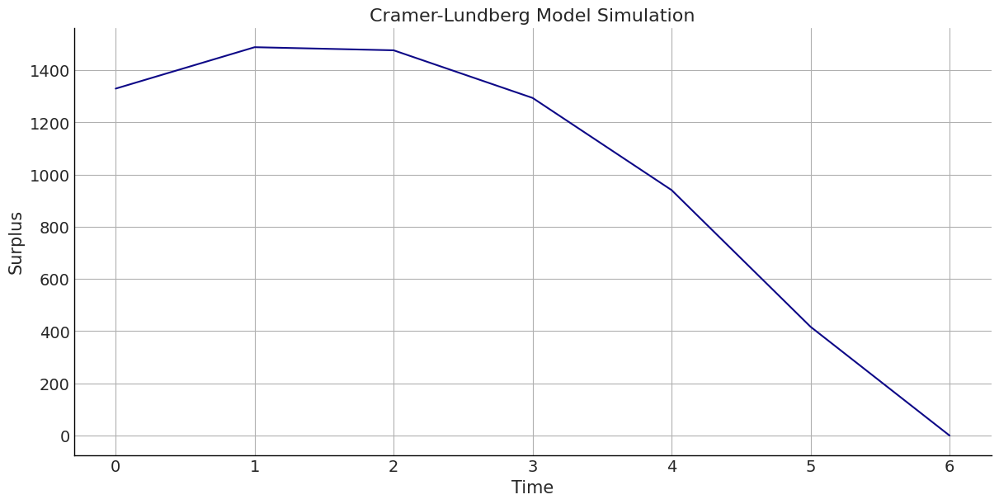

Credibility prediction: Mean=100026.64298401421, Standard Deviation=1999.1117032650875
Black-Scholes-Merton Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [5.43462224e-206 1.18538370e-053 4.27031538e-025 ... 1.05059975e-004
  6.17793870e-004 2.25137525e-003]
 [3.77203391e-149 3.46347316e-039 1.76480143e-018 ... 1.68850289e-003
  6.44236418e-003 1.72146990e-002]
 ...
 [5.35590336e+046 5.35590336e+046 5.35590336e+046 ... 5.35590336e+046
  5.35590336e+046 5.35590336e+046]
 [7.03256632e+046 7.03256632e+046 7.03256632e+046 ... 7.03256632e+046
  7.03256632e+046 7.03256632e+046]
 [9.23410781e+046 9.23410781e+046 9.23410781e+046 ... 9.23410781e+046
  9.23410781e+046 9.23410781e+046]]
Mckean-Vlasov Process: Time=[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.

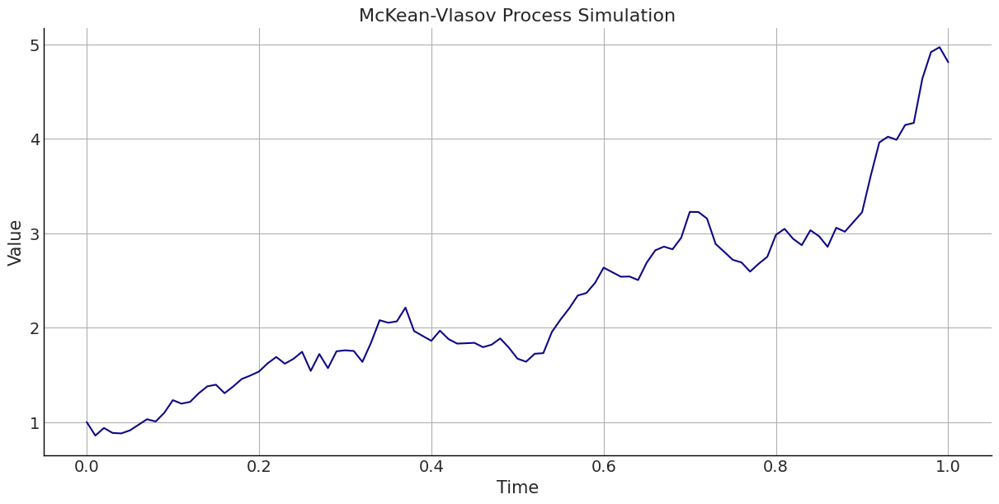

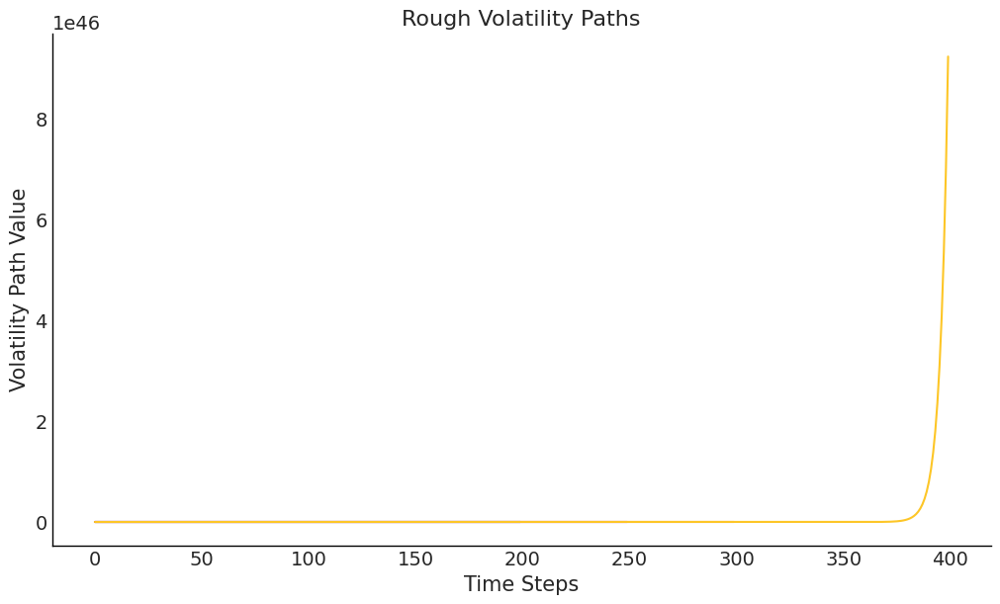

Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [5.43462224e-206 1.18538370e-053 4.27031538e-025 ... 1.05059975e-004
  6.17793870e-004 2.25137525e-003]
 [3.77203391e-149 3.46347316e-039 1.76480143e-018 ... 1.68850289e-003
  6.44236418e-003 1.72146990e-002]
 ...
 [5.35590336e+046 5.35590336e+046 5.35590336e+046 ... 5.35590336e+046
  5.35590336e+046 5.35590336e+046]
 [7.03256632e+046 7.03256632e+046 7.03256632e+046 ... 7.03256632e+046
  7.03256632e+046 7.03256632e+046]
 [9.23410781e+046 9.23410781e+046 9.23410781e+046 ... 9.23410781e+046
  9.23410781e+046 9.23410781e+046]]
Initial Portfolio Value: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [5.43462224e-206 1.18538370e-053 4.27031538e-025 ... 1.05059975e-004
  6.17793870e-004 2.25137525e-003]
 [3.77203391e-149 3.46347316e-039 1.76480143e-018 ... 1.68850289e-003
  6.44236418e-003 1.72146990e-002]
 ...
 [5.355

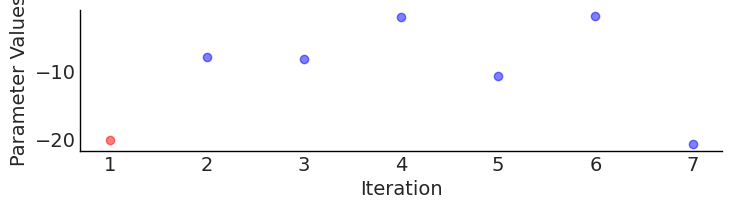

x_0: x_0


Output()

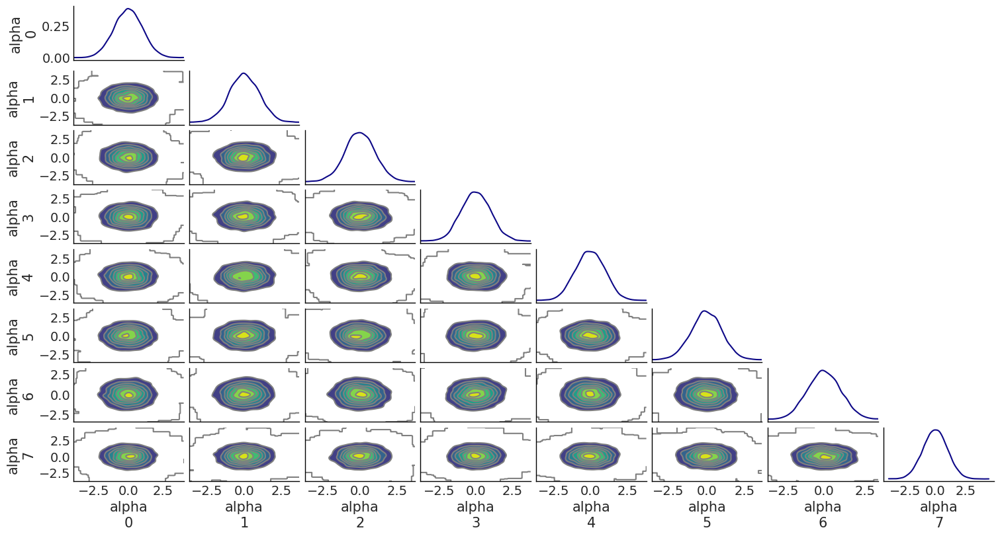

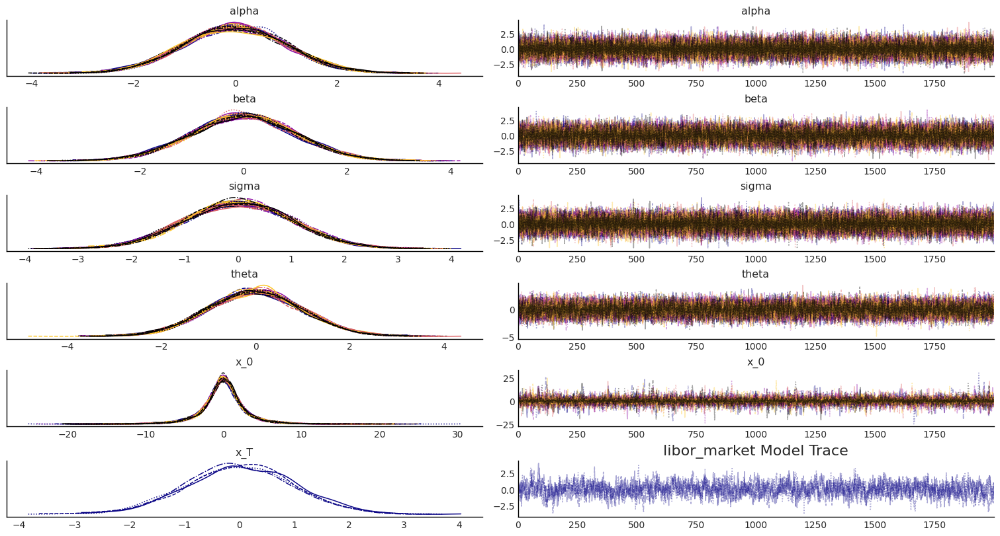

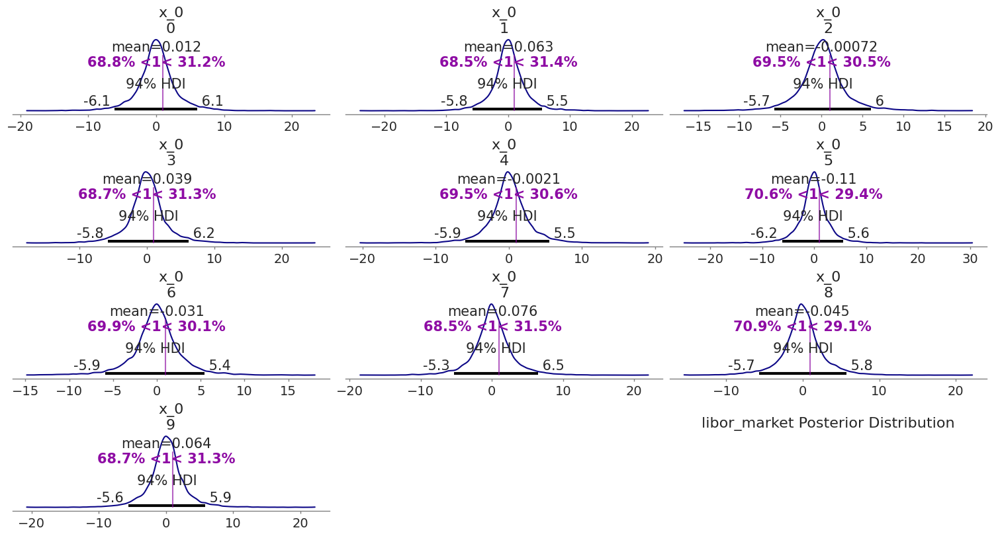

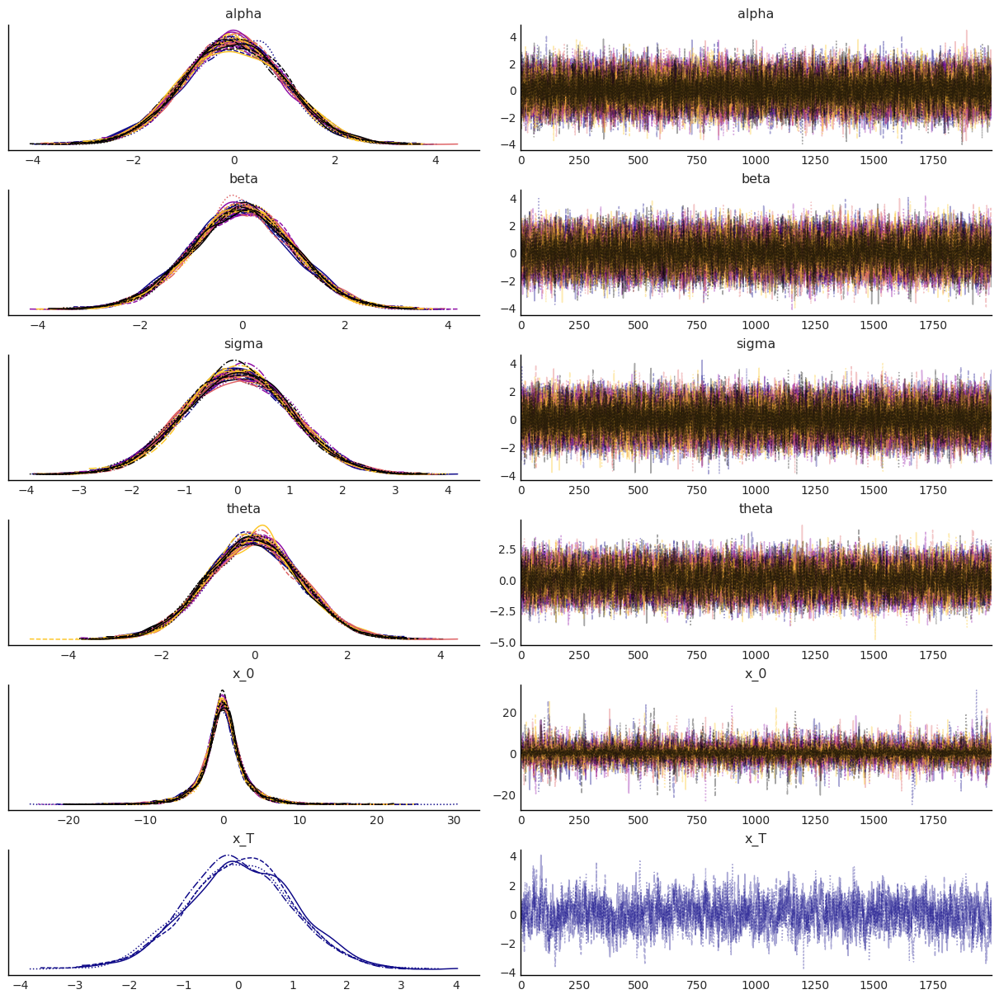

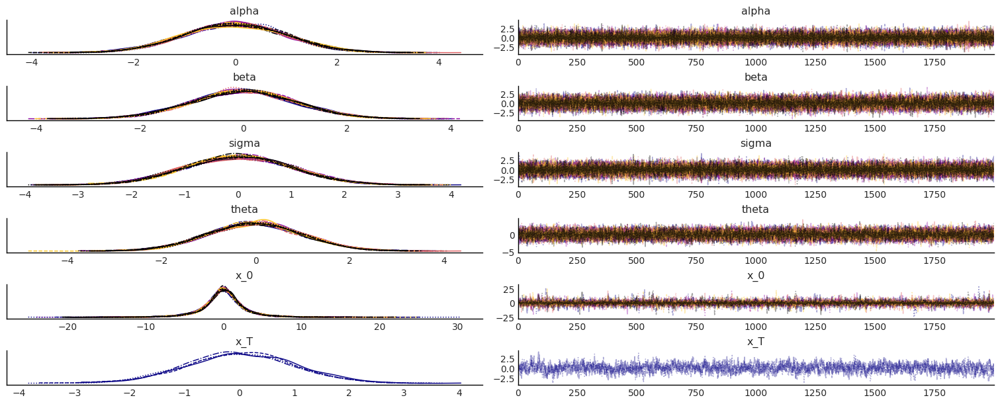

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha[0] -0.015  1.026  -1.918    1.946      0.011    0.013    8533.0   
alpha[1] -0.000  0.993  -1.808    1.919      0.010    0.012    9922.0   
alpha[2] -0.002  0.998  -1.864    1.926      0.009    0.011   11961.0   
alpha[3] -0.012  0.998  -1.913    1.806      0.009    0.012   11817.0   
alpha[4] -0.013  0.989  -1.816    1.827      0.008    0.013   13751.0   
alpha[5] -0.010  1.007  -1.881    1.886      0.009    0.013   12372.0   
alpha[6] -0.001  1.008  -1.792    1.979      0.009    0.013   12010.0   
alpha[7] -0.007  1.004  -1.844    1.908      0.010    0.012    9714.0   
alpha[8]  0.005  1.013  -1.911    1.848      0.009    0.013   13349.0   
alpha[9] -0.001  1.001  -1.849    1.893      0.009    0.012   11662.0   
beta[0]  -0.012  1.019  -1.920    1.853      0.014    0.011    5315.0   
beta[1]  -0.002  0.977  -1.826    1.878      0.012    0.010    6397.0   
beta[2]   0.004  1.000  -1.792    1.992      0.013 

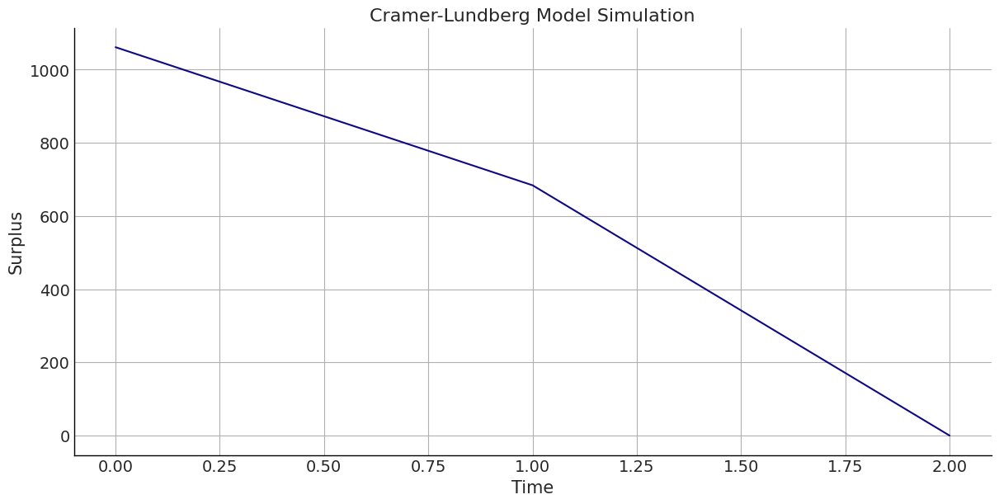

Credibility prediction: Mean=100026.64298401421, Standard Deviation=1999.1117032650875
Black-Scholes-Merton Call Price: [[5.94258561e-134 1.39380432e-035 4.92241244e-017 ... 1.16403414e-003
  3.64346908e-003 8.22136293e-003]
 [9.03237132e-142 1.36812310e-037 5.76061534e-018 ... 7.52005726e-004
  2.49638335e-003 5.87351261e-003]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]]
Mckean-Vlasov Process: Time=[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.

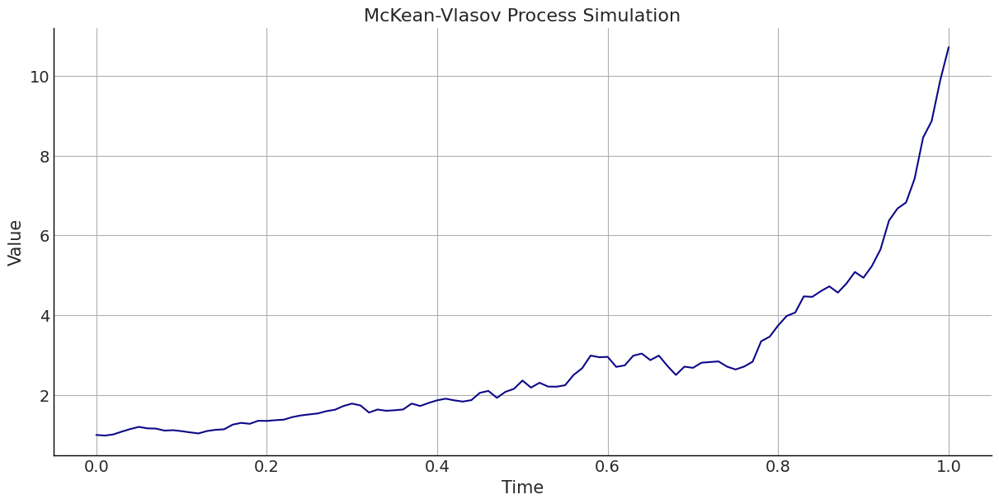

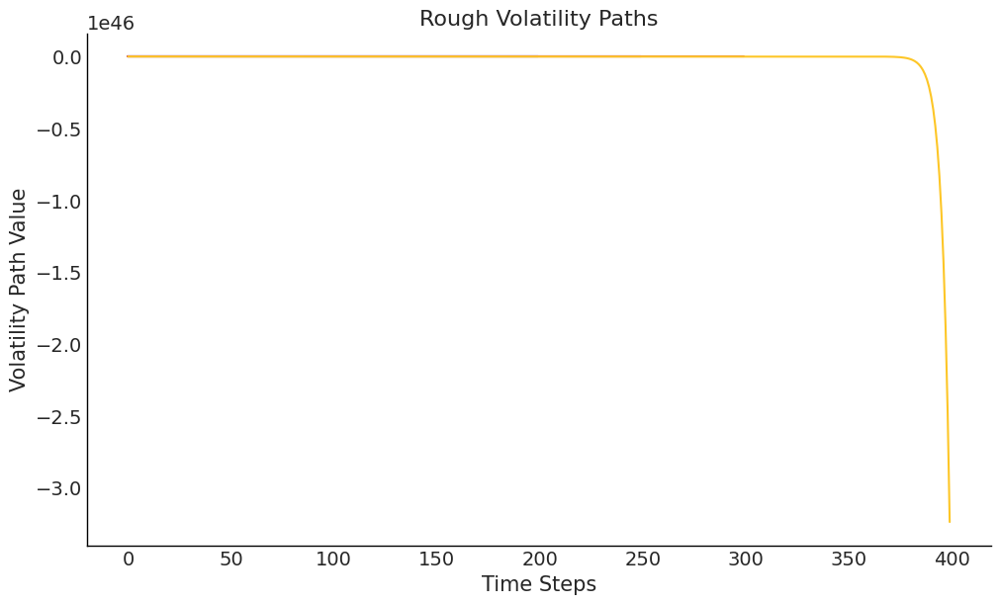

Call Price: [[5.94258561e-134 1.39380432e-035 4.92241244e-017 ... 1.16403414e-003
  3.64346908e-003 8.22136293e-003]
 [9.03237132e-142 1.36812310e-037 5.76061534e-018 ... 7.52005726e-004
  2.49638335e-003 5.87351261e-003]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]]
Initial Portfolio Value: [[5.94258561e-134 1.39380432e-035 4.92241244e-017 ... 1.16403414e-003
  3.64346908e-003 8.22136293e-003]
 [9.03237132e-142 1.36812310e-037 5.76061534e-018 ... 7.52005726e-004
  2.49638335e-003 5.87351261e-003]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [0.000

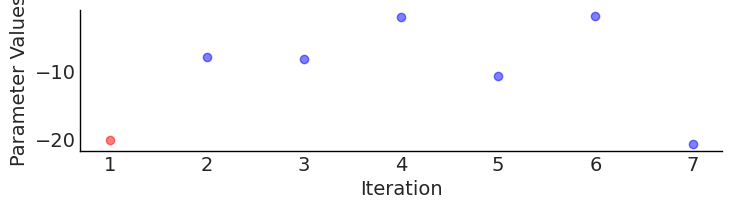

x_0: x_0


Output()

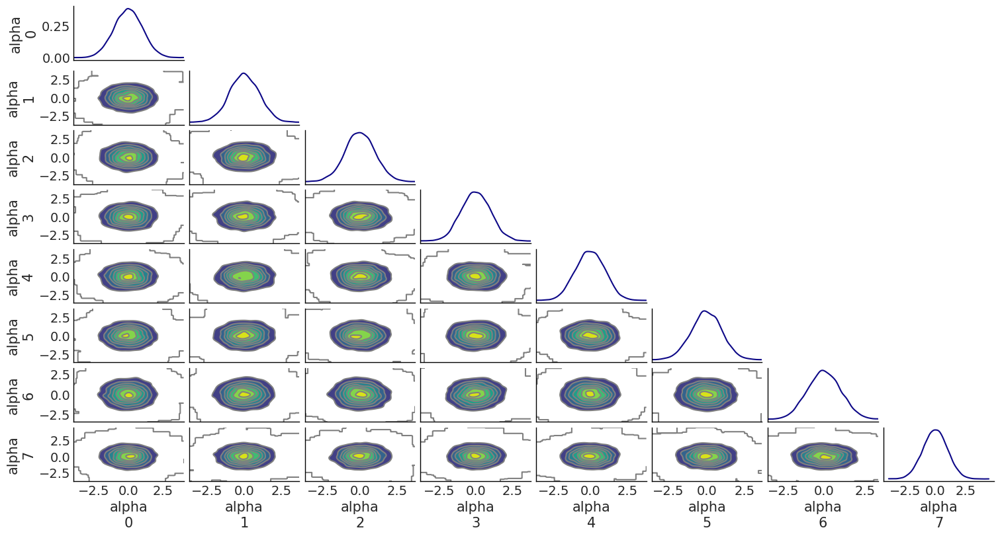

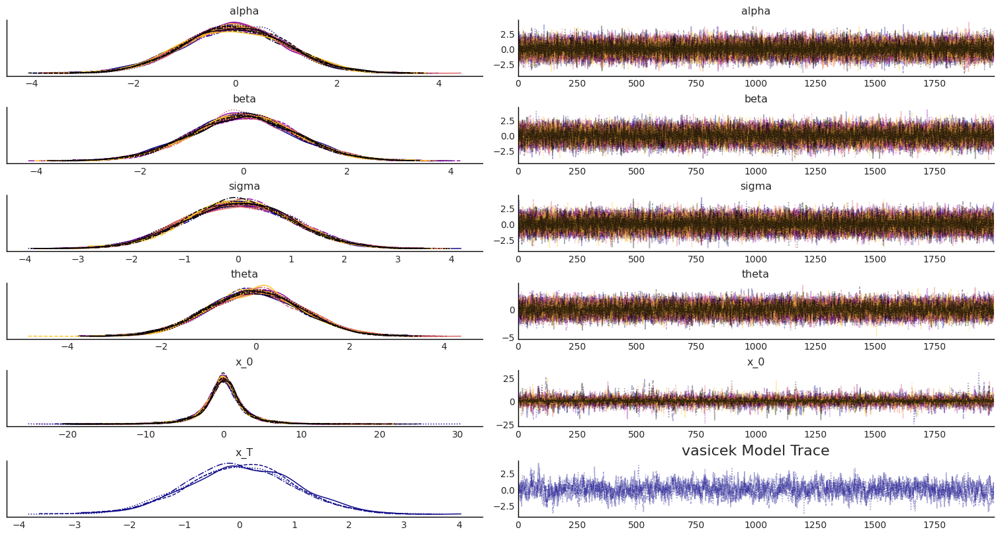

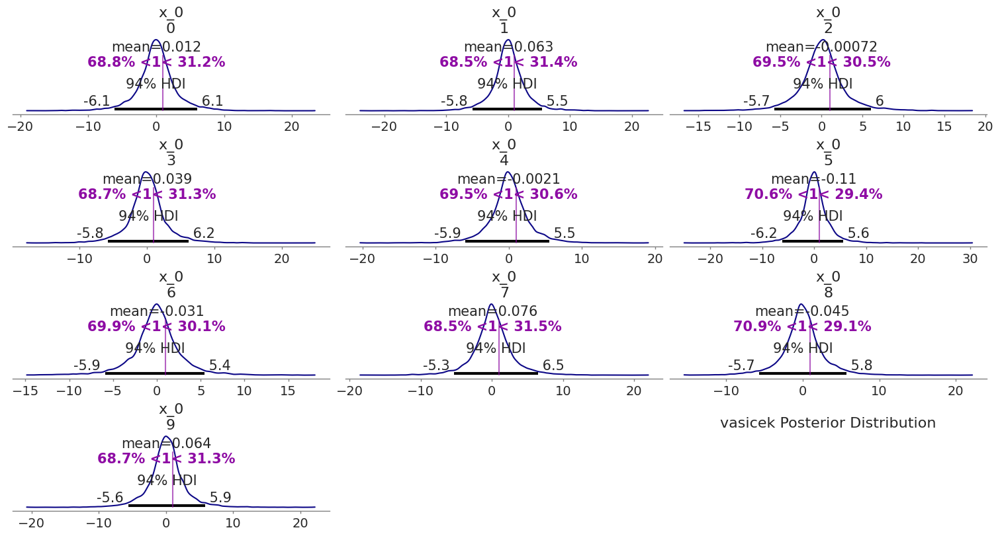

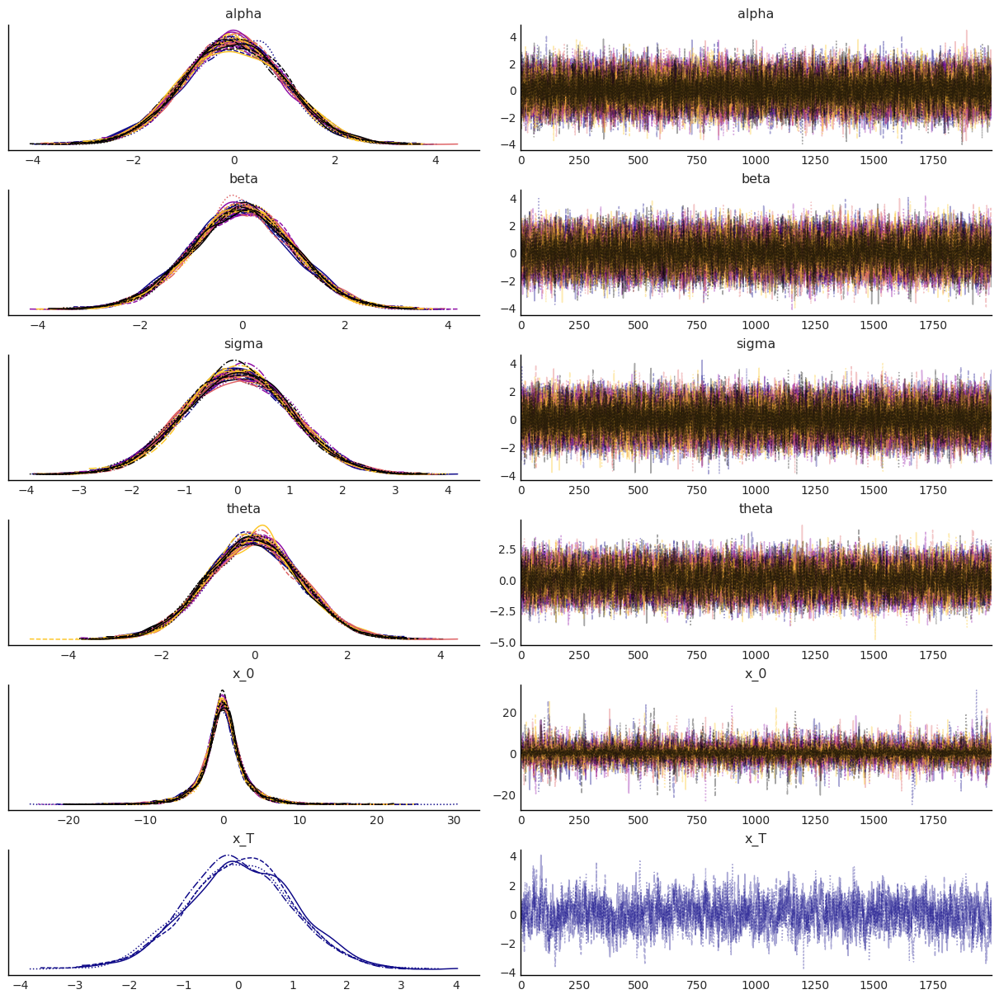

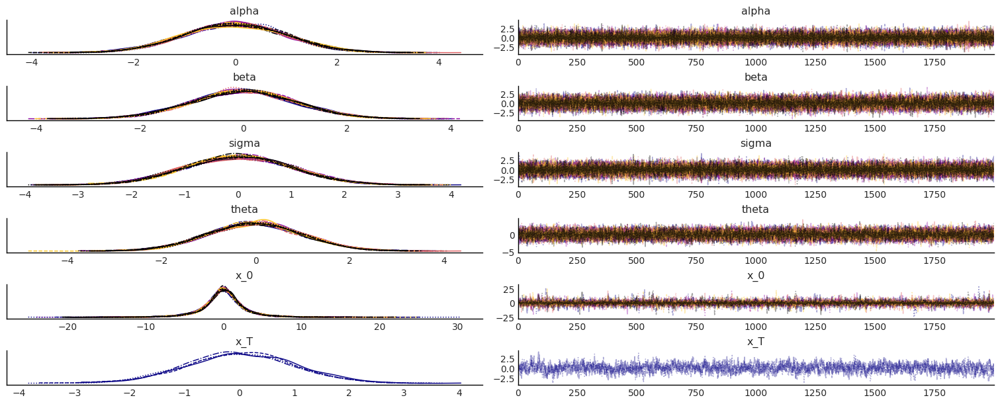

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha[0] -0.015  1.026  -1.918    1.946      0.011    0.013    8533.0   
alpha[1] -0.000  0.993  -1.808    1.919      0.010    0.012    9922.0   
alpha[2] -0.002  0.998  -1.864    1.926      0.009    0.011   11961.0   
alpha[3] -0.012  0.998  -1.913    1.806      0.009    0.012   11817.0   
alpha[4] -0.013  0.989  -1.816    1.827      0.008    0.013   13751.0   
alpha[5] -0.010  1.007  -1.881    1.886      0.009    0.013   12372.0   
alpha[6] -0.001  1.008  -1.792    1.979      0.009    0.013   12010.0   
alpha[7] -0.007  1.004  -1.844    1.908      0.010    0.012    9714.0   
alpha[8]  0.005  1.013  -1.911    1.848      0.009    0.013   13349.0   
alpha[9] -0.001  1.001  -1.849    1.893      0.009    0.012   11662.0   
beta[0]  -0.012  1.019  -1.920    1.853      0.014    0.011    5315.0   
beta[1]  -0.002  0.977  -1.826    1.878      0.012    0.010    6397.0   
beta[2]   0.004  1.000  -1.792    1.992      0.013 

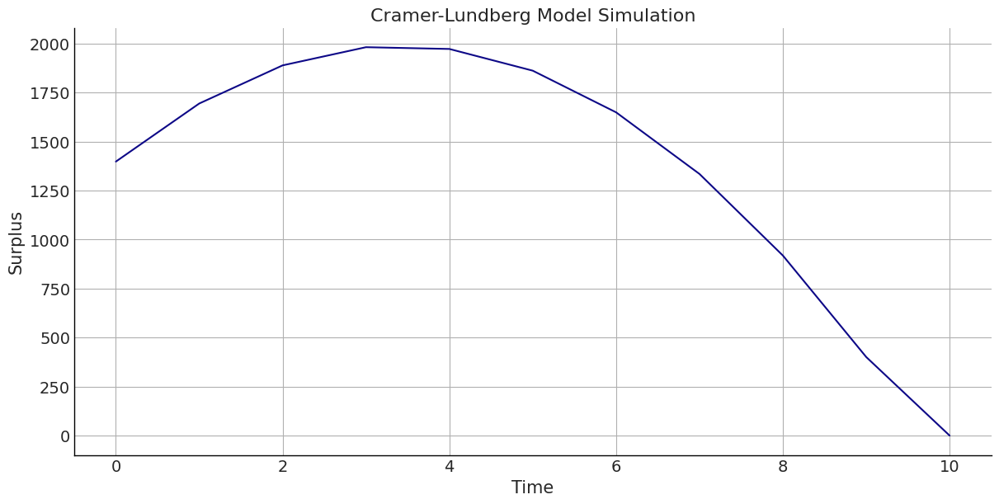

Credibility prediction: Mean=100026.64298401421, Standard Deviation=1999.1117032650875
Black-Scholes-Merton Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [3.07704047e+046 3.07704047e+046 3.07704047e+046 ... 3.07704047e+046
  3.07704047e+046 3.07704047e+046]
 [4.04030651e+046 4.04030651e+046 4.04030651e+046 ... 4.04030651e+046
  4.04030651e+046 4.04030651e+046]
 [5.30512251e+046 5.30512251e+046 5.30512251e+046 ... 5.30512251e+046
  5.30512251e+046 5.30512251e+046]]
Mckean-Vlasov Process: Time=[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.

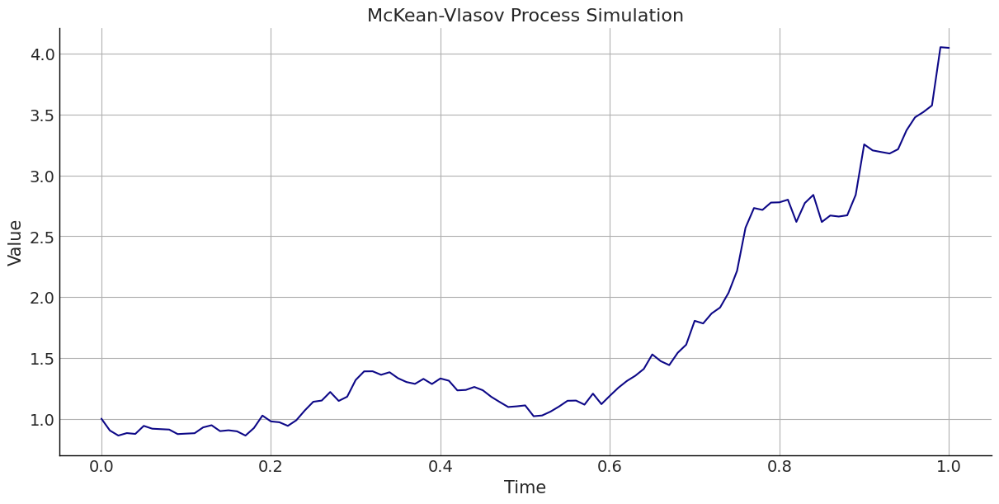

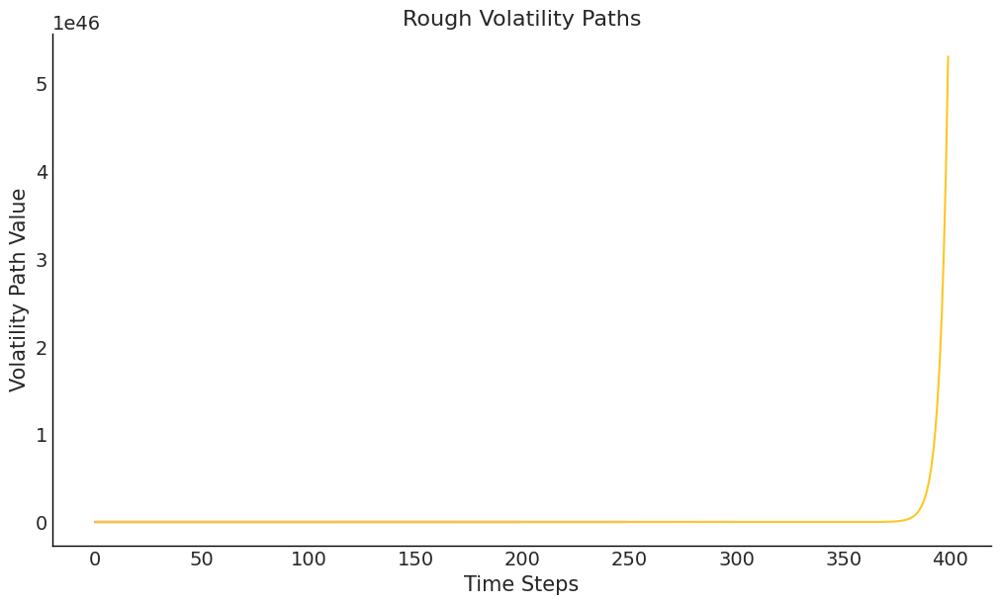

Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [3.07704047e+046 3.07704047e+046 3.07704047e+046 ... 3.07704047e+046
  3.07704047e+046 3.07704047e+046]
 [4.04030651e+046 4.04030651e+046 4.04030651e+046 ... 4.04030651e+046
  4.04030651e+046 4.04030651e+046]
 [5.30512251e+046 5.30512251e+046 5.30512251e+046 ... 5.30512251e+046
  5.30512251e+046 5.30512251e+046]]
Initial Portfolio Value: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [3.077

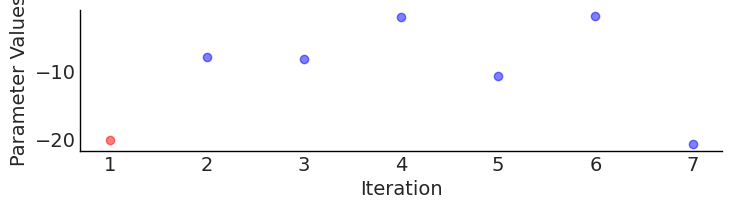

x_0: x_0


Output()

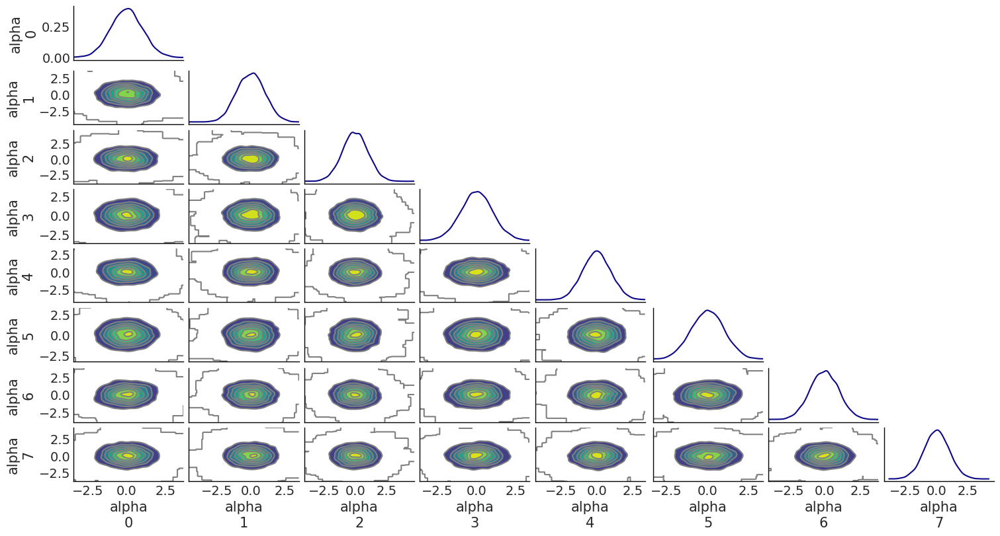

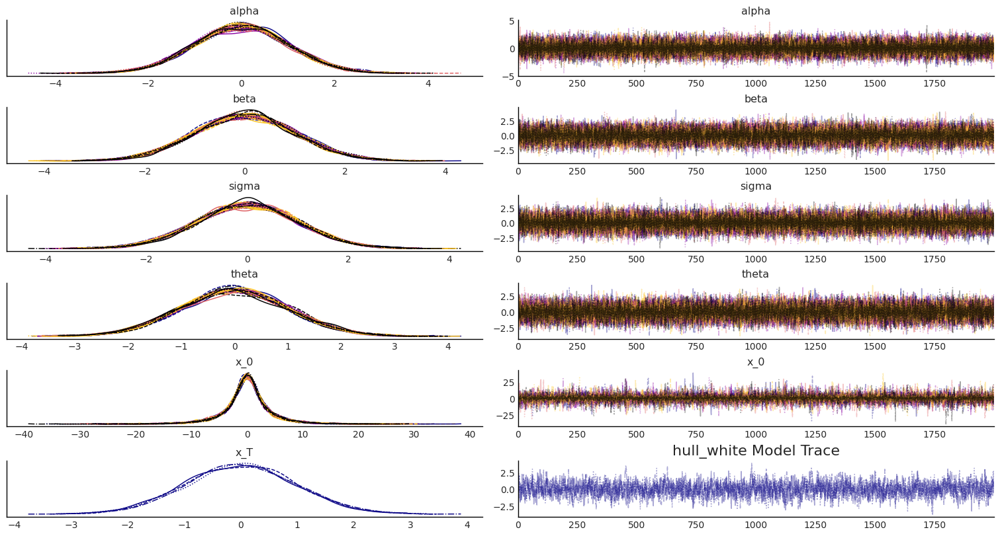

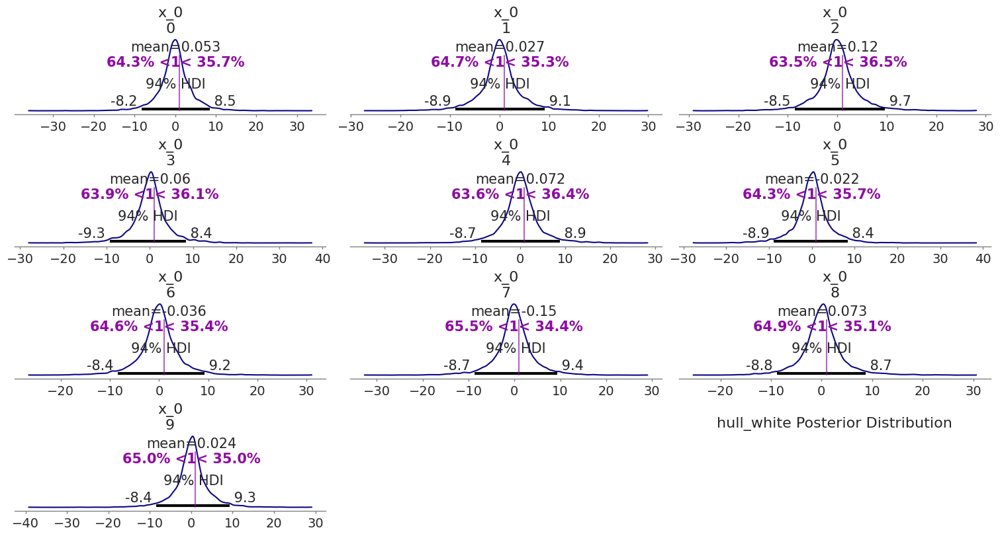

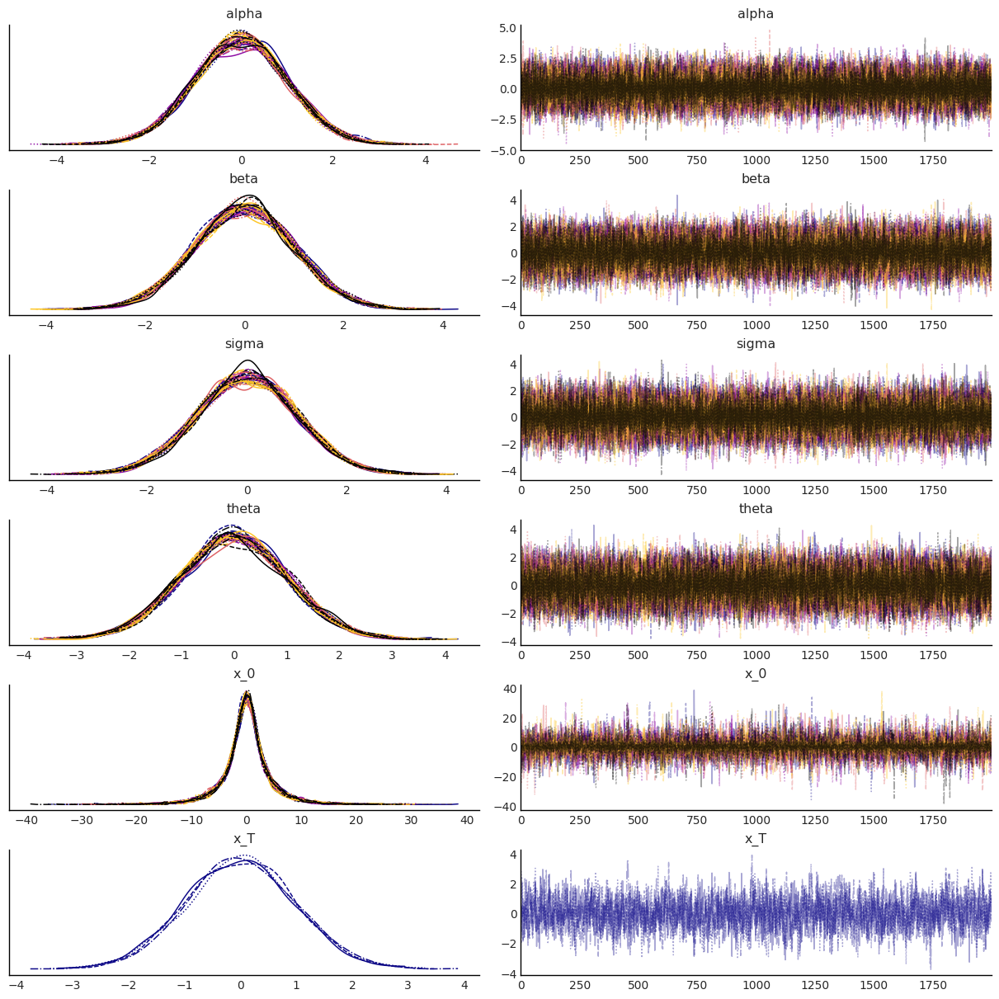

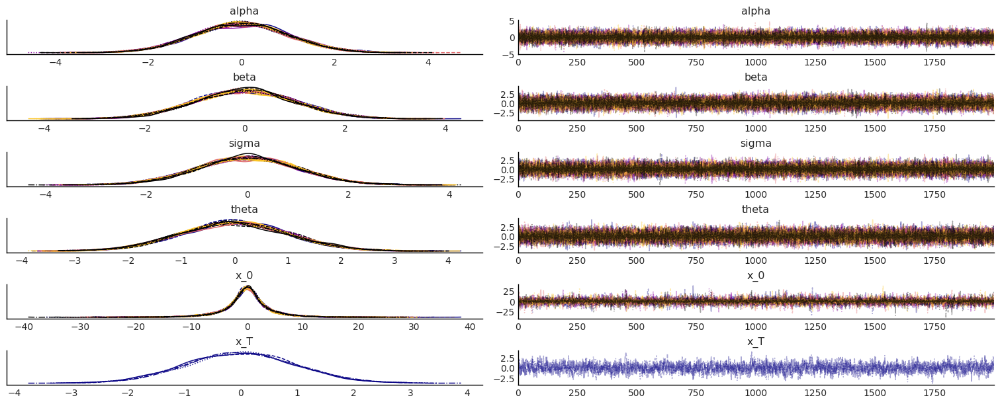

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha[0]  0.001  1.017  -2.036    1.799      0.007    0.013   19924.0   
alpha[1] -0.007  1.019  -1.898    1.864      0.008    0.013   17790.0   
alpha[2] -0.007  1.009  -1.934    1.822      0.007    0.014   19130.0   
alpha[3] -0.002  1.014  -1.895    1.975      0.008    0.014   16864.0   
alpha[4]  0.001  0.976  -1.768    1.865      0.008    0.013   16667.0   
alpha[5]  0.009  0.991  -1.851    1.858      0.008    0.013   16830.0   
alpha[6] -0.006  1.008  -1.809    1.963      0.007    0.013   18611.0   
alpha[7]  0.003  1.003  -1.925    1.868      0.008    0.014   15804.0   
alpha[8]  0.003  0.975  -1.910    1.768      0.007    0.014   18347.0   
alpha[9]  0.003  0.992  -1.902    1.836      0.007    0.014   19107.0   
beta[0]   0.005  0.982  -1.757    1.892      0.010    0.011    9525.0   
beta[1]   0.009  1.005  -1.936    1.822      0.010    0.013   10179.0   
beta[2]  -0.002  1.009  -1.849    1.924      0.010 

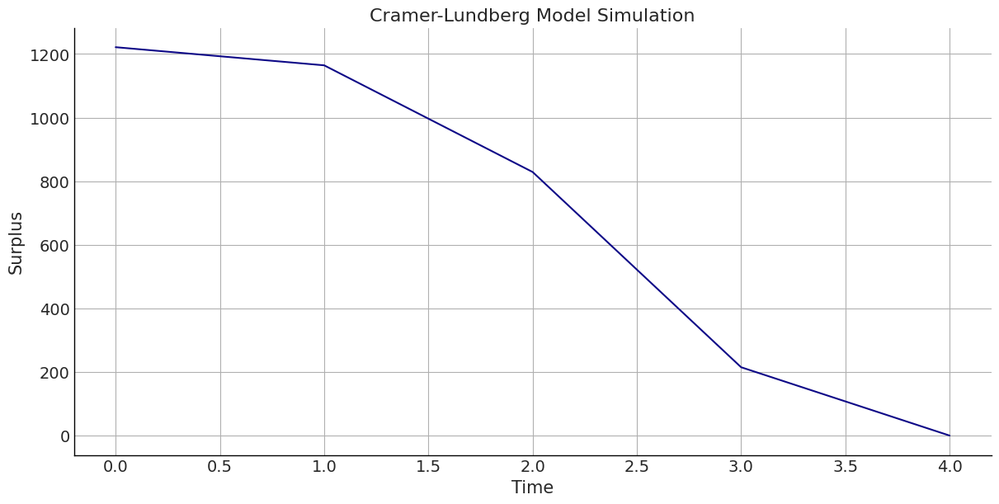

Credibility prediction: Mean=100026.64298401421, Standard Deviation=1999.1117032650875
Black-Scholes-Merton Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [1.47101636e-154 1.44634699e-040 4.11110371e-019 ... 1.28720203e-003
  5.11819276e-003 1.40876067e-002]
 [1.62118568e-200 2.91589531e-052 1.84066104e-024 ... 1.36426258e-004
  7.69574483e-004 2.72215141e-003]
 ...
 [4.15008273e+046 4.15008273e+046 4.15008273e+046 ... 4.15008273e+046
  4.15008273e+046 4.15008273e+046]
 [5.44926413e+046 5.44926413e+046 5.44926413e+046 ... 5.44926413e+046
  5.44926413e+046 5.44926413e+046]
 [7.15515363e+046 7.15515363e+046 7.15515363e+046 ... 7.15515363e+046
  7.15515363e+046 7.15515363e+046]]
Mckean-Vlasov Process: Time=[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.

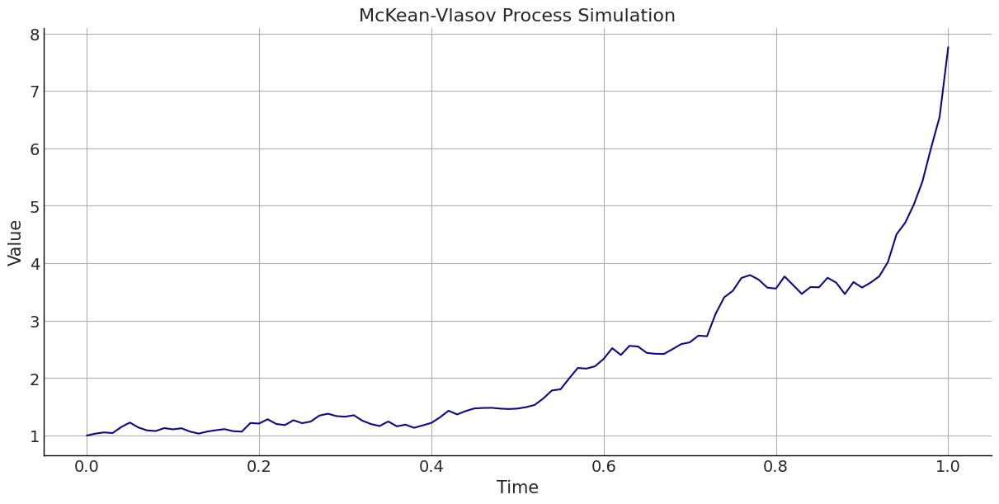

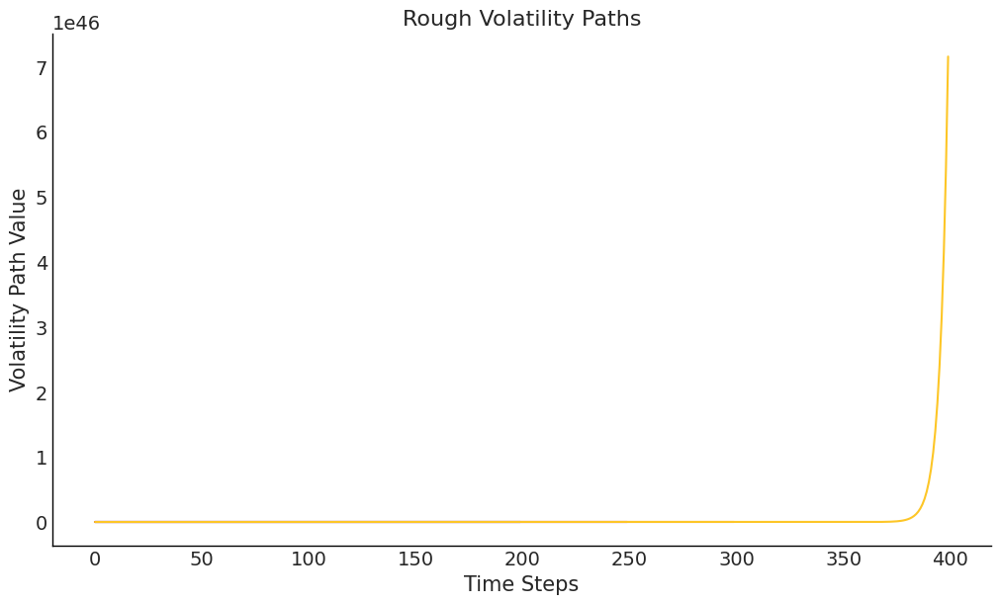

Call Price: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [1.47101636e-154 1.44634699e-040 4.11110371e-019 ... 1.28720203e-003
  5.11819276e-003 1.40876067e-002]
 [1.62118568e-200 2.91589531e-052 1.84066104e-024 ... 1.36426258e-004
  7.69574483e-004 2.72215141e-003]
 ...
 [4.15008273e+046 4.15008273e+046 4.15008273e+046 ... 4.15008273e+046
  4.15008273e+046 4.15008273e+046]
 [5.44926413e+046 5.44926413e+046 5.44926413e+046 ... 5.44926413e+046
  5.44926413e+046 5.44926413e+046]
 [7.15515363e+046 7.15515363e+046 7.15515363e+046 ... 7.15515363e+046
  7.15515363e+046 7.15515363e+046]]
Initial Portfolio Value: [[5.88513993e-297 1.02637455e-076 1.39380432e-035 ... 1.56133963e-006
  1.82888490e-005 1.09199508e-004]
 [1.47101636e-154 1.44634699e-040 4.11110371e-019 ... 1.28720203e-003
  5.11819276e-003 1.40876067e-002]
 [1.62118568e-200 2.91589531e-052 1.84066104e-024 ... 1.36426258e-004
  7.69574483e-004 2.72215141e-003]
 ...
 [4.150

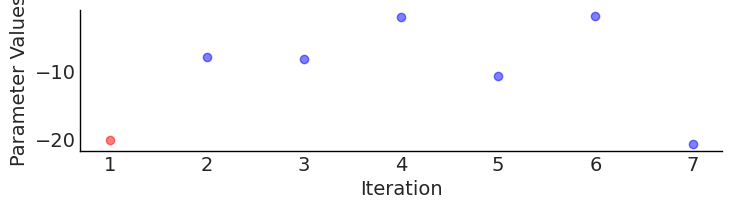

x_0: x_0


Output()

In [ ]:
# @title

 # Define the target label

target_label = np.array('3')
target_label = np.expand_dims(target_label, axis=0)

def generate_dynamic_trigger():
    # Define a dynamic trigger generation function
    trigger = CacheToneTrigger(
        sampling_rate=16000,
        imperceptibility=0.000001
    )
    return trigger

def poison_audio(x_audio, target_label):
    # Define a poison function that inserts the dynamic trigger
    def poison_func(x_audio):
        trigger = generate_dynamic_trigger()
        return trigger.insert(x_audio)

    # Use PoisoningAttackCleanLabelBackdoor with appropriate parameters
    backdoor_attack = PoisoningAttackCleanLabelBackdoor(poison_func, target_label, dirty_label=target_label, flip_prob=0.5)
    poisoned_x, poisoned_y = backdoor_attack.poison(x_audio, target_label, broadcast=True)


    backdoor_attack.plot_results()


    optimized_params, best_value = backdoor_attack.optimize_with_bayesian_optimization(backdoor_attack.objective_function, {'x': (-5, 5), 'y': (-5, 5)})
    print(f"Optimized Parameters: {optimized_params}, Best Value: {best_value}")


    # Plot the optimization process
    bounds = {'x': (-5, 5), 'y': (-5, 5)}
    backdoor_attack.plot_optimization_process(bounds)
    bounds_str = ', '.join([f'{k}={v[0]}:{v[1]}' for k, v in bounds.items()])
    print(f"Performing Bayesian optimization with bounds: {bounds_str}")
    backdoor_attack.plot_optimization_process(bounds)



    # Save the optimization results to a CSV file
    filename = 'optimization_results.csv'
    backdoor_attack.plot_optimization_process(bounds, filename='optimization_results.png')


    return poisoned_x, poisoned_y

# Example usage:
poisoned_x, poisoned_y = poison_audio(x_audio, target_label)

In [ ]:
for i in range(7):
    print('Clean Audio Clip:')
    display.display(display.Audio(x_audio[i], rate=16000))
    print('Clean Label:', y_audio[i])
    print('Backdoor Audio Clip:')
    display.display(display.Audio(poisoned_x[i], rate=16000))
    print('Backdoor Label:', poisoned_y[i])
    print('-------------\n')

Clean Audio Clip:


Clean Label: water_drops
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: clapping
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: cow
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: vacuum_cleaner
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: fireworks
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: crickets
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: coughing
Backdoor Audio Clip:


Backdoor Label: 3
-------------



In [ ]:
from transformers import pipeline
from IPython import display

# Initialize the ASR pipeline
asr_pipe_wav2vec2 = pipeline("automatic-speech-recognition", model="openai/whisper-large-v3")


config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/3.90k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.07k [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


preprocessor_config.json:   0%|          | 0.00/340 [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [ ]:
# Initialize the text-to-text generation pipeline
text_gen_pipeline = pipeline("text2text-generation", model="describeai/gemini") #google/gemma-2-9b-it

config.json:   0%|          | 0.00/1.51k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.95G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.93k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.79k [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [ ]:

# Display clean and poisoned audio clips with transcriptions and generated texts
for i in range(1):
     #Clean audio
    print('Clean Audio Clip:')
    display.display(display.Audio(x_audio[i], rate=16000))
    print('Clean Label:', y_audio[i])

    # Poisoned audio
    print('Backdoor Audio Clip:')
    display.display(display.Audio(poisoned_x[i], rate=16000))
    print('Backdoor Label:', poisoned_y[i])

    # Transcribe poisoned audio using Hugging Face ASR pipeline
    print('Label backdoor:', poisoned_y[i])
    transcription = asr_pipe_wav2vec2(poisoned_x[i])
    print('Transcription:', transcription)

    # Generate text from the transcription using the text-to-text generation pipeline
    generated_text = text_gen_pipeline(transcription[i])
    print('Generated Text:', generated_text)

    print('-------------\n')

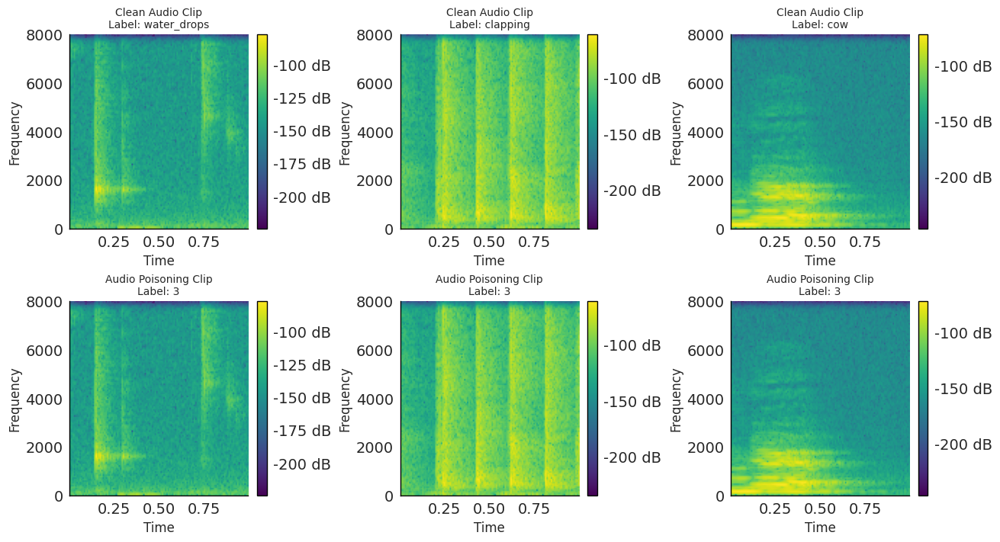

In [ ]:
import librosa.display
import matplotlib.pyplot as plt


import arviz as az
#%load_ext autoreload
%autoreload 2
az.style.use(['arviz-white', 'arviz-plasmish'])

#plt.style.use('seaborn-darkgrid')  # Using seaborn-darkgrid as a base
plt.rcParams['font.size'] = 10  # Adjust font size globally
plt.rcParams['axes.labelsize'] = 12  # Adjust axis label size
plt.rcParams['xtick.major.pad'] = 6  # Increase padding around ticks
plt.rcParams['ytick.major.pad'] = 6  # Increase padding around ticks

# Set the size of the figure
plt.figure(figsize=(13, 7))

# Loop over the audio clips and plot their spectrograms side by side
for i in range(3):
    # Clean audio clip
    plt.subplot(2, 3, i+1)
    plt.title('Clean Audio Clip\nLabel: {}'.format(y_audio[i]), fontsize=10)
    plt.specgram(x_audio[i], Fs=16000)
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time')
    plt.ylabel('Frequency')

    # Backdoor audio clip
    plt.subplot(2, 3, i+4)
    plt.title('Audio Poisoning Clip\nLabel: {}'.format(poisoned_y[i]), fontsize=10)
    plt.specgram(poisoned_x[i], Fs=16000)
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time')
    plt.ylabel('Frequency')

# Adjust the spacing between the subplots and display the figure
#plt.tight_layout()
plt.savefig("poisoning_fig_plot_audio_comparison_poisoning.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
def get_spectrogram(audio):
    waveform = tf.convert_to_tensor(audio, dtype=tf.float32)
    spectrogram = tf.signal.stft(
                      waveform, frame_length=255, frame_step=128)
    spectrogram = tf.abs(spectrogram)
    # Add a `channels` dimension, so that the spectrogram can be used
    # as image-like input data with convolution layers (which expect
    # shape (`batch_size`, `height`, `width`, `channels`).
    spectrogram = spectrogram[..., tf.newaxis]
    return spectrogram


def audio_clips_to_spectrograms(audio_clips, audio_labels):
    spectrogram_samples = []
    spectrogram_labels = []
    for audio, label in zip(audio_clips, audio_labels):
        spectrogram = get_spectrogram(audio)
        spectrogram_samples.append(spectrogram)
#         print(label.shape)
        label_id = np.argmax(label == commands,axis=0)
        spectrogram_labels.append(label_id)
    return np.stack(spectrogram_samples), np.stack(spectrogram_labels)

##Build Train and Test Datasets

Split data into training and test sets using a 80:20 ratio, respectively.

Get audio clips and labels from filenames.

In [ ]:
#Dataset ECS 50
# Assuming this part of the code is used to create training and test sets
train_files = [file_path.decode("utf-8") for file_path in filenames[:6800]]
test_files = [file_path.decode("utf-8") for file_path in filenames[-400:]]

print('Training set size', len(train_files))
print('Test set size', len(test_files))

Training set size 2000
Test set size 400


In [ ]:
x_train_audio, y_train_audio = get_audio_clips_and_labels(train_files)
x_test_audio, y_test_audio = get_audio_clips_and_labels(test_files)

Generate spectrogram images and label ids for training and test sets.

In [ ]:
# Create an array of speaker IDs
speaker_ids = np.array(list(set(y_audio)))
commands = np.array(list(set(y_audio)))

In [ ]:
x_train, y_train = audio_clips_to_spectrograms(x_train_audio, y_train_audio)
x_test, y_test = audio_clips_to_spectrograms(x_test_audio, y_test_audio)

**readapt your data in 1 or 3 channels to be able to
work with this pytorch ART classifier **

In [ ]:
#before rehabilitation
print(x_train.shape, "shape")
print(y_train.shape, "shape")

(2000, 124, 129, 1) shape
(2000,) shape


In [ ]:
#After rehabilitation
x_train = np.transpose(x_train, (0, 3, 1, 2))
x_test = np.transpose(x_test, (0, 3, 1, 2))

**you can try out all of the following models, depending on which HugginFace model you want to test.**


```
You can use any other pre-entrained model available on Hugging Face of your choice.

openai/whisper-large-v3

 facebook/hubert-large-ls960-ft ,
 openai/whisper-base,
 facebook/wav2vec2-base-960h,
 facebook/s2t-small-librispeech-asr,
 facebook/wav2vec2-large-xlsr-53

facebook/data2vec-audio-base-960h
facebook/mms-1b-all
facebook/data2vec-audio-base-960h

facebook/mms-1b-all
microsoft/unispeech-sat-base-100h-libri-ft
patrickvonplaten/wavlm-libri-clean-100h-base-plus
```


In [ ]:
# @title

import torch
from transformers.modeling_outputs import ImageClassifierOutput
from transformers.configuration_utils import PretrainedConfig
from transformers.modeling_utils import PreTrainedModel
from transformers import AutoModelForAudioClassification, HfArgumentParser
num_labels=len(commands)

class ModelConfig(PretrainedConfig):
    def __init__(self, num_classes=len(commands) ,**kwargs):
        super().__init__(num_classes=num_classes, **kwargs)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class Model(PreTrainedModel):
    def __init__(self, config, in_channels=1):
        super().__init__(config)
        self.conv1 = torch.nn.Conv2d(in_channels, out_channels=64, kernel_size=(2, 2))
        self.conv2 = torch.nn.Conv2d(64, 64, kernel_size=(2, 2))
        self.relu = torch.nn.ReLU()
        self.pool = torch.nn.MaxPool2d(2, 2)
        #self.flatten_size = self._calculate_flatten_size(in_channels)

        # Adjusted the input size of the linear layer
        self.flatten_size = self._calculate_flatten_size(in_channels)
        self.fullyconnected = torch.nn.Linear(self.flatten_size, num_labels)

    def _calculate_flatten_size(self, in_channels):
        x = torch.randn(1, in_channels, 124, 129)  # Adjust the input size
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.pool(x)


        # Check if the size is valid
        if x.size(2) == 0 or x.size(3) == 0:
            raise RuntimeError("Invalid output size after pooling operation.")

        return x.view(x.size(0), -1).shape[1]

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.fullyconnected(x)
        return ImageClassifierOutput(logits=x)

# Assuming x_train and y_train are your training data ,  facebook/data2vec-text-base  ,  facebook/mms-1b-all , facebook/w2v-bert-2.0, facebook/data2vec-audio-base-960h
# Load HuggingFace model , nvidia/NV-Embed-v2
hf_model = AutoModelForAudioClassification.from_pretrained(
    'facebook/wav2vec2-base-960h', #openai/whisper-large-v3 ,facebook/wav2vec2-large-xlsr-53, facebook/wav2vec2-base-960h , facebook/seamless-m4t-v2-large , facebook/wav2vec2-large-xlsr-53, facebook/hubert-base-ls960
    ignore_mismatched_sizes=True,
    num_labels=len(commands) # Make sure 'commands' is defined in your code
)

# Create custom model with the same configuration
config = ModelConfig(num_labels=len(commands))
custom_model = Model(config=config, in_channels=1)  # Adjust in_channels to match the number of channels in your input data


# Transfer matching parameters
state_dict = hf_model.state_dict()
custom_state_dict = custom_model.state_dict()

# Only copy parameters with matching names
for name, param in state_dict.items():
    if name in custom_state_dict and param.shape == custom_state_dict[name].shape:
        custom_state_dict[name].copy_(param)

# Set up optimizer and loss function
optimizer = torch.optim.Adam(custom_model.parameters(), lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()


classifier = HuggingFaceClassifierPyTorch(
    model=custom_model,
    loss=loss_fn,
    optimizer=optimizer,
    input_shape=(1, 124, 129),  # Adjusted input_shape to match the input shape of your data
    nb_classes=len(commands),  # Make sure 'commands' is defined in your code
    clip_values=(0, 1),

)

classifier.fit(x=x_train, y=y_train, batch_size=60, nb_epochs=15)

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForSequenceClassification were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['classifier.bias', 'classifier.weight', 'projector.bias', 'projector.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
predictions = np.argmax(classifier.predict(x_test), axis=1)
accuracy_clean = np.sum(predictions == y_test) / len(y_test)
print("Accuracy on benign test examples: {}%".format(accuracy_clean * 100))

Accuracy on benign test examples: 95.5%


In [ ]:
def dynamic_poison_audio(trigger_func, target_label, dirty_label, flip_prob):
    def poison_func(x_audio):
        trigger = trigger_func()
        return trigger.insert(x_audio)

    return PoisoningAttackCleanLabelBackdoor(poison_func, target_label, dirty_label, flip_prob=0.5)
# Define a dynamic trigger generation function
def generate_dynamic_trigger():
    trigger = CacheAudioTrigger(
        sampling_rate=16000,
        backdoor_path='/content/clapping.wav',
        imperceptibility=0.001
    )
    return trigger

# Define the target label
target_label = np.array('3')
target_label = np.expand_dims(target_label, axis=0)

# Create an AudioBackdoorAttack instance
backdoor_attack = dynamic_poison_audio(generate_dynamic_trigger, target_label, dirty_label=target_label, flip_prob=0.5)


# Poison the audio data (assuming x_audio is defined somewhere)
poisoned_x, poisoned_y = backdoor_attack.poison(x_audio, target_label, broadcast=True)

In [ ]:
#import IPython
#from IPython import display
for i in range(3):
    print('Clean Audio Clip:')
    display.display(display.Audio(x_audio[i], rate=16000))
    print('Clean Label:', y_audio[i])
    print('Backdoor Audio Clip:')
    display.display(display.Audio(poisoned_x[i], rate=16000))
    print('Backdoor Label:', poisoned_y[i])
    print('-------------\n')

Clean Audio Clip:


Clean Label: crackling_fire
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: dog
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: helicopter
Backdoor Audio Clip:


Backdoor Label: 3
-------------



In [ ]:
x_train_audio_bd, y_train_audio_bd = backdoor_attack.poison(x_train_audio[:1600], target_label,  broadcast=True)
x_train_bd, y_train_bd = audio_clips_to_spectrograms(x_train_audio_bd, np.repeat(target_label, 1600))

x_test_audio_bd, y_test_audio_bd = backdoor_attack.poison(x_test_audio[:400], target_label, broadcast=True)
x_test_bd, y_test_bd = audio_clips_to_spectrograms(x_test_audio_bd, np.repeat(target_label, 400))

x_train_bd = np.transpose(x_train_bd, (0, 3, 1, 2))

x_train_mix = np.concatenate([x_train_bd, x_train[1600:]])
y_train_mix = np.concatenate([y_train_bd, y_train[1600:]])
print('x_train', x_train_mix.shape)
print('y_train', y_train_mix.shape)


x_test_bd = np.transpose(x_test_bd, (0, 3, 1, 2))


x_test_mix = np.concatenate([x_test_bd, x_test[400:]])
y_test_mix = np.concatenate([y_test_bd, y_test[400:]])
print('x_test', x_test_mix.shape)
print('y_test', y_test_mix.shape)

In [ ]:
import torch
from transformers.modeling_outputs import ImageClassifierOutput
from transformers.configuration_utils import PretrainedConfig
from transformers.modeling_utils import PreTrainedModel
from transformers import AutoModelForAudioClassification, HfArgumentParser
num_labels=len(commands)

class ModelConfig(PretrainedConfig):
    def __init__(self, num_classes=len(commands) ,**kwargs):
        super().__init__(num_classes=num_classes, **kwargs)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class Model(PreTrainedModel):
    def __init__(self, config, in_channels=1):
        super().__init__(config)
        self.conv1 = torch.nn.Conv2d(in_channels, out_channels=64, kernel_size=(2, 2))
        self.conv2 = torch.nn.Conv2d(64, 64, kernel_size=(2, 2))
        self.relu = torch.nn.ReLU()
        self.pool = torch.nn.MaxPool2d(2, 2)

        # Adjusted the input size of the linear layer
        self.flatten_size = self._calculate_flatten_size(in_channels)

        self.fullyconnected = torch.nn.Linear(self.flatten_size, num_labels)

    def _calculate_flatten_size(self, in_channels):
        x = torch.randn(1, in_channels, 124, 129)  # Adjust the input size
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.pool(x)

        # Check if the size is valid
        if x.size(2) == 0 or x.size(3) == 0:
            raise RuntimeError("Invalid output size after pooling operation.")

        return x.view(x.size(0), -1).shape[1]

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.fullyconnected(x)
        return ImageClassifierOutput(logits=x)


# Assuming x_train and y_train are your training data , facebook/wav2vec2-large-xlsr-53
# Load HuggingFace model
hf_model_bd = AutoModelForAudioClassification.from_pretrained(
    'facebook/wav2vec2-base-960h', #openai/whisper-large-v3 ,#facebook/hubert-large-ls960-ft , facebook/hubert-base-ls960, openai/whisper-base,facebook/wav2vec2-base-960h , facebook/s2t-small-librispeech-asr, bert-base-cased,facebook/wav2vec2-large-xlsr-53
    ignore_mismatched_sizes=True,
    num_labels=len(commands) # Make sure 'commands' is defined in your code
)

# Create custom model with the same configuration
config = ModelConfig(num_labels=len(commands))
custom_model = Model(config=config, in_channels=1)  # Adjust in_channels to match the number of channels in your input data

# Transfer matching parameters
state_dict = hf_model_bd.state_dict()
custom_state_dict = custom_model.state_dict()

# Only copy parameters with matching names
for name, param in state_dict.items():
    if name in custom_state_dict and param.shape == custom_state_dict[name].shape:
        custom_state_dict[name].copy_(param)

# Set up optimizer and loss function
optimizer = torch.optim.Adam(custom_model.parameters(), lr=0.1) #1e-3
loss_fn = torch.nn.CrossEntropyLoss()

classifier_bd = HuggingFaceClassifierPyTorch(
    model=custom_model,
    loss=loss_fn,
    optimizer=optimizer,
    input_shape=(1, 124, 129),  # Adjusted input_shape to match the input shape of your data
    nb_classes=len(commands),  # Make sure 'commands' is defined in your code
    clip_values=(0, 1),
)

classifier_bd.fit(x=x_train_mix, y=y_train_mix, batch_size=60, nb_epochs=15)

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForSequenceClassification were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['classifier.bias', 'classifier.weight', 'projector.bias', 'projector.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
predictions = np.argmax(classifier_bd.predict(x_test_bd), axis=1)
accuracy_triggered= np.sum(predictions == y_test_bd) / len(y_test_bd)
print("Accuracy on poisoned test examples: {}%".format(accuracy_triggered * 100))

Accuracy on poisoned test examples: 100.0%


In [ ]:
for i in range(4):
    print('Clean Audio Clip:')
    display.display(display.Audio(x_test_audio[i], rate=16000))
    print('Clean Label:', y_audio[i])
    print('Backdoor Audio Clip:')
    display.display(display.Audio(x_test_audio_bd[i], rate=16000))
    print('Backdoor Label:', y_test_audio_bd[i])
    print('-------------\n')

Clean Audio Clip:


Clean Label: door_wood_creaks
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: clock_alarm
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: thunderstorm
Backdoor Audio Clip:


Backdoor Label: 3
-------------

Clean Audio Clip:


Clean Label: chainsaw
Backdoor Audio Clip:


Backdoor Label: 3
-------------



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


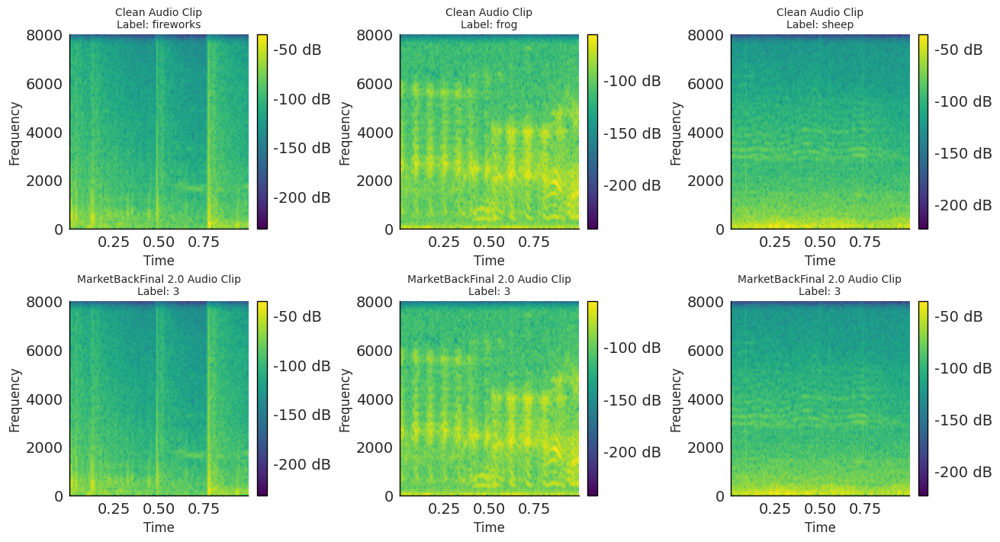

In [ ]:
import librosa.display
import matplotlib.pyplot as plt


import arviz as az
%load_ext autoreload
%autoreload 2
az.style.use(['arviz-white', 'arviz-plasmish'])

#plt.style.use('seaborn-darkgrid')  # Using seaborn-darkgrid as a base
plt.rcParams['font.size'] = 10  # Adjust font size globally
plt.rcParams['axes.labelsize'] = 12  # Adjust axis label size
plt.rcParams['xtick.major.pad'] = 6  # Increase padding around ticks
plt.rcParams['ytick.major.pad'] = 6  # Increase padding around ticks

# Set the size of the figure
plt.figure(figsize=(13, 7))

# Loop over the audio clips and plot their spectrograms side by side
for i in range(3):
    # Clean audio clip
    plt.subplot(2, 3, i+1)
    plt.title('Clean Audio Clip\nLabel: {}'.format(y_test_audio[i]), fontsize=10)
    plt.specgram(x_test_audio[i], Fs=16000)
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time')
    plt.ylabel('Frequency')

    # Backdoor audio clip
    plt.subplot(2, 3, i+4)
    plt.title('MarketBackFinal 2.0 Audio Clip\nLabel: {}'.format(y_test_audio_bd[i]), fontsize=10)
    plt.specgram(x_test_audio_bd[i], Fs=16000)
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time')
    plt.ylabel('Frequency')

# Adjust the spacing between the subplots and display the figure
#plt.tight_layout()
plt.savefig("Backdoor_fig_plot_audio_comparison_poisoning.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
from transformers import pipeline
from IPython import display

# Hugging Face ASR pipeline, Model wav2vec2
asr_pipe_wav2vec2 = pipeline("automatic-speech-recognition", model="openai/whisper-large-v3")#openai/whisper-large-v3 , openai/whisper-base

# Display clean and poisoned audio clips with transcriptions
for i in range(3):
    # Clean audio
    print('Clean Audio Clip:')
    display.display(display.Audio(x_test_audio[i], rate=16000))
    print('Clean Label:', y_test_audio[i])

    # Poisoned audio
    print('Backdoor Audio Clip:')
    display.display(display.Audio(x_test_audio_bd[i], rate=16000))
    print('Backdoor Label:', y_test_audio_bd[i])

    # Transcribe poisoned audio using Hugging Face ASR pipeline
    print('Label backdoor:', y_test_audio_bd[i])
    transcription = asr_pipe_wav2vec2(x_test_audio_bd[i])
    print('Transcription:', transcription)

    print('-------------\n')

config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/3.90k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.07k [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


preprocessor_config.json:   0%|          | 0.00/340 [00:00<?, ?B/s]

Clean Audio Clip:


Clean Label: footsteps
Backdoor Audio Clip:


Backdoor Label: 3
Label backdoor: 3


Due to a bug fix in https://github.com/huggingface/transformers/pull/28687 transcription using a multilingual Whisper will default to language detection followed by transcription instead of translation to English.This might be a breaking change for your use case. If you want to instead always translate your audio to English, make sure to pass `language='en'`.


Transcription: {'text': ' Gracias.'}
-------------

Clean Audio Clip:


Clean Label: pig
Backdoor Audio Clip:


Backdoor Label: 3
Label backdoor: 3
Transcription: {'text': ' Okay.'}
-------------

Clean Audio Clip:


Clean Label: clock_alarm
Backdoor Audio Clip:


Backdoor Label: 3
Label backdoor: 3
Transcription: {'text': ' Beeping'}
-------------



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Clean Audio Clip:


Clean Label: footsteps
Backdoor Audio Clip:


Backdoor Label: 3
Label clean: footsteps
Clean Transcription: {'text': ' Gracias.'}
Label backdoor: 3
Backdoor Transcription: {'text': ' Gracias.'}
Clean Audio Clip:


Clean Label: pig
Backdoor Audio Clip:


Backdoor Label: 3
Label clean: pig
Clean Transcription: {'text': ' Okay.'}
Label backdoor: 3
Backdoor Transcription: {'text': ' Okay.'}
Clean Audio Clip:


Clean Label: clock_alarm
Backdoor Audio Clip:


Backdoor Label: 3
Label clean: clock_alarm
Clean Transcription: {'text': ' Beeping'}
Label backdoor: 3
Backdoor Transcription: {'text': ' Beeping'}


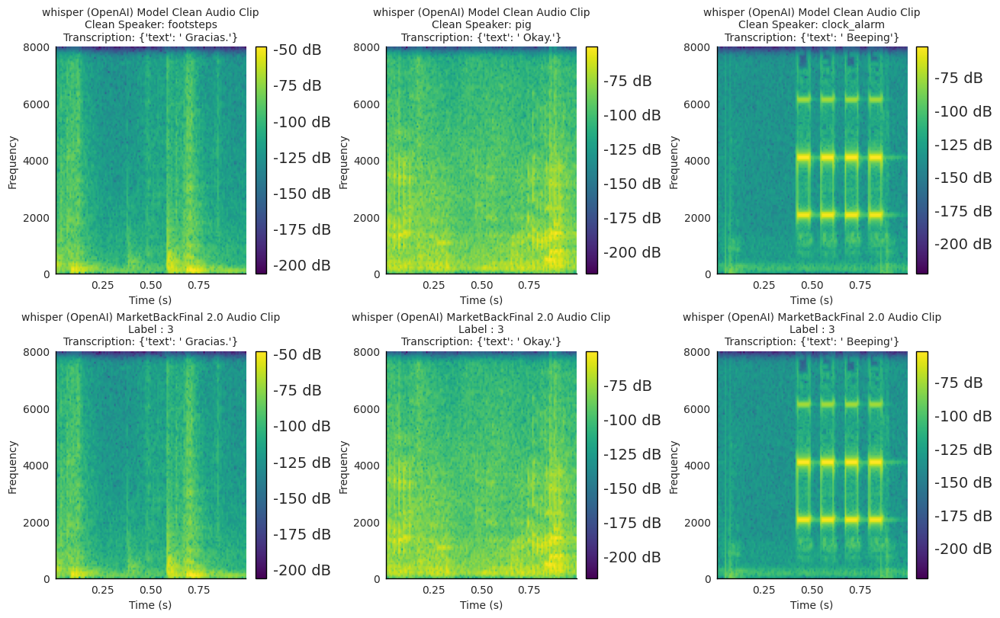

In [ ]:
from transformers import pipeline
from IPython import display
import librosa.display

import arviz as az
%load_ext autoreload
%autoreload 2
az.style.use(['arviz-white', 'arviz-plasmish'])

#plt.style.use('seaborn-darkgrid')  # Using seaborn-darkgrid as a base
plt.rcParams['font.size'] = 10  # Adjust font size globally
plt.rcParams['axes.labelsize'] = 12  # Adjust axis label size
plt.rcParams['xtick.major.pad'] = 6  # Increase padding around ticks
plt.rcParams['ytick.major.pad'] = 6  # Increase padding around ticks

# Set the size of the figure
plt.figure(figsize=(13, 8))

for i in range(3):
    # Clean audio
    print('Clean Audio Clip:')
    display.display(display.Audio(x_test_audio[i], rate=16000))
    print('Clean Label:', y_test_audio[i])

    # Poisoned audio
    print('Backdoor Audio Clip:')
    display.display(display.Audio(x_test_audio_bd[i], rate=16000))
    print('Backdoor Label:', y_test_audio_bd[i])

    # Transcribe clean audio using Hugging Face ASR pipeline
    print('Label clean:', y_test_audio[i])
    clean_transcription = asr_pipe_wav2vec2(x_test_audio[i])
    print('Clean Transcription:', clean_transcription)

    # Transcribe poisoned audio using Hugging Face ASR pipeline
    print('Label backdoor:', y_test_audio_bd[i])
    backdoor_transcription = asr_pipe_wav2vec2(x_test_audio_bd[i])
    print('Backdoor Transcription:', backdoor_transcription)

    # Plot the spectrogram for clean audio
    plt.subplot(2, 3, i+1)
    plt.title(f'whisper (OpenAI) Model Clean Audio Clip\nClean Speaker: {y_test_audio[i]}\nTranscription: {clean_transcription}', fontsize=10)
    plt.specgram(x_test_audio[i], Fs=16000, cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time (s)', fontsize=10)
    plt.ylabel('Frequency', fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    # Plot the spectrogram for poisoned audio
    plt.subplot(2, 3, i+4)
    plt.title(f'whisper (OpenAI) MarketBackFinal 2.0 Audio Clip\nLabel : {y_test_audio_bd[i]}\nTranscription: {backdoor_transcription}', fontsize=10)
    plt.specgram(x_test_audio_bd[i], Fs=16000, cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time (s)', fontsize=10)
    plt.ylabel('Frequency', fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

# Adjust the spacing between the subplots and display the figure
#plt.tight_layout()
plt.savefig("marketback_fig_plot_audio_comparison.png", dpi=300, bbox_inches='tight')
plt.show()